<a href="https://colab.research.google.com/github/rjthompson22/MBSUS_SS-GAN/blob/main/SS_GAN_28x28.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
print("Complete")

Mounted at /content/gdrive
Complete


#Notes:


In [ ]:
from __future__ import print_function, division

import random
from random import shuffle

import numpy as np
import matplotlib.pyplot as plt
import copy

import os
from os import listdir
from os.path import join

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.autograd import Variable
import torch.nn.functional as F

import torchvision
import torchvision.utils as vutils
from torchvision import utils, models

# from nvidia.dali.pipeline import Pipeline
# import nvidia.dali.ops as ops
# import nvidia.dali.types as types
# from nvidia.dali.plugin.pytorch import DALIGenericIterator, DALIClassificationIterator

import warnings
warnings.filterwarnings("ignore")

np.random.seed(42)
random.seed(10)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
torch.manual_seed(999)

device = torch.device("cuda")

In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms, datasets
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)
import os
import cv2
import numpy as np
from PIL import Image
print("Complete")

Complete


In [ ]:
img_dir = '/content/gdrive/My Drive/MBSUS/Training+Testing/Training'
unsup_dir = '/content/gdrive/MyDrive/MBSUS/All Ultrasound Frames'
batch_size = 100
resize = 28

transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,)),
                                transforms.Resize((resize,resize),interpolation=Image.NEAREST),
                                transforms.Grayscale(num_output_channels=1),
                                transforms.RandomHorizontalFlip(p=0.5)
])
dataset = datasets.ImageFolder(img_dir, transform=transform)
print(dataset.class_to_idx)

len_train = round(len(dataset)*0.7)
len_val = round(len(dataset)*0.2)
len_test = round(len(dataset)*0.1)

train_set, val_set, test_set = torch.utils.data.random_split(dataset, [len_train, len_val, len_test])



train_loader = DataLoader(
    train_set,
    batch_size = batch_size,
    shuffle = True
)

val_loader = DataLoader(
    val_set,
    batch_size = batch_size,
    shuffle = True
)

test_loader = DataLoader(
    test_set,
    batch_size = batch_size,
    shuffle = True
)

unsup_dataset = datasets.ImageFolder(unsup_dir, transform=transform)
len_unsup = round(len(unsup_dataset)*0.08)
rest_unsup = round(len(unsup_dataset)*0.92)
unsup_set, _ = torch.utils.data.random_split(unsup_dataset, [len_unsup, rest_unsup])

batches = len(train_set)/batch_size
unsup_batch_size = int(len(unsup_set)/batches)

unsup_loader = DataLoader(
    unsup_set,
    batch_size = unsup_batch_size,
    shuffle = True
)

print("Number of Unsupervised Samples: %d" %len_unsup)
print("Number of pics per Unsup Batch: %d" %unsup_batch_size)
print("Number of UnSup Batches: %d" %(len_unsup//unsup_batch_size))

{'Non-Pneumonia': 0, 'Pneumonia': 1}
Number of Unsupervised Samples: 5629
Number of pics per Unsup Batch: 373
Number of UnSup Batches: 15


In [ ]:
print("Number of Sup Batches: %d" %batches)

Number of Sup Batches: 15


In [ ]:
# Use a (not pre-trained) ResNet18 with d_out = 2 as the Classifier
classifier = models.resnet18(pretrained=False)
classifier.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3,
                               bias=False)
num_ftrs = classifier.fc.in_features
classifier.fc = nn.Linear(num_ftrs, 2)
classifier = classifier.to(device)

optimizerC = optim.SGD(classifier.parameters(), lr=0.001, momentum=0.9, dampening=0, weight_decay=0.0001)

In [ ]:
def test(model, device, test_loader, m_test, display = False, verdicts = False):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for _, batch in enumerate(test_loader):
            data, target = batch
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += criterion(output, target).item() 
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()
            if verdicts == True:
              for i in range(len(pred)):
                t = target.view_as(pred)[i].item()
                if pred[i].item() == target.view_as(pred)[i].item():
                  plt.imshow(data[i].to('cpu').squeeze(0))
                  plt.title("%d" %t)
                  plt.show()

    test_loss /= m_test

    if display == True:
        print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, m_test,
        100. * correct / m_test))
        
    # test_loader.reset()    
    return test_loss, 100. * correct / m_test

In [ ]:
# criterion = nn.CrossEntropyLoss()

# epochs = 200

# val_losses = []
# val_accuracies = []

# best_model_wts = copy.deepcopy(classifier.state_dict())
# best_acc = 0.0

# for epoch in range(1, epochs + 1):
    
#     classifier.train()
#     for real, label in tqdm(train_loader):
#       real = real.to(device)
#       label = label.to(device)
#       optimizerC.zero_grad()
#       output = classifier(real)
#       loss = criterion(output, label)
#       loss.backward()
    
#       if epoch % 50 == 0:
#           print('Train Epoch: {} \tLoss: {:.6f}'.format(epoch, loss.item()))
      
#           val_loss, val_accuracy = test(classifier, device, val_loader, val_pipe.epoch_size(), True)
#           val_losses.append(val_loss)
#           val_accuracies.append(val_accuracy)
#       else:
#           val_loss, val_accuracy = test(classifier, device, val_loader, len_val, False)
#           val_losses.append(val_loss)
#           val_accuracies.append(val_accuracy)
          
#       if val_accuracy > best_acc:
#           best_acc = val_accuracy
#           best_classifier_wts = copy.deepcopy(classifier.state_dict())
          
#       optimizerC.step()
        
# plt.plot(range(len(val_losses)), np.array(val_losses))
# plt.show()

# print('Best VAL test accuracy: ', np.max(np.array(val_accuracies)),
#       '% after ', np.argmax(np.array(val_accuracies)), ' training epochs')

# # load best model weights
# classifier.load_state_dict(best_classifier_wts)

# print("\n Best model on the test set: ")
# test(classifier, device, test_loader, len_test, True)

In [ ]:
# custom weights initialization called on the Generator
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
        

# Number of channels in the training images. For color images this is 3
nc = 1
# Size of z latent vector 
z_dim = 100
# Size of feature maps in generator
ngf = 64

lr = 0.0001
beta_1 = 0.5
beta_2 = 0.999



class Generator(nn.Module):

  def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
    super(Generator, self).__init__()
    self.z_dim = z_dim

    self.gen = nn.Sequential(
        self.make_gen_block(z_dim, hidden_dim * 4),
        self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
        self.make_gen_block(hidden_dim * 2, hidden_dim),
        self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer = True)
        #1 x 28 x 28
    )

  def make_gen_block(self, input_channels, output_channels, kernel_size = 3, stride = 2, final_layer = False):

    if not final_layer:
      return nn.Sequential(
          nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
          nn.BatchNorm2d(output_channels),
          nn.LeakyReLU(inplace=True)
      )
    else:
        return nn.Sequential(
            nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
            nn.Tanh()
        )

  def forward(self, noise):
    x = noise.view(len(noise), self.z_dim, 1,1)
    return self.gen(x)

def get_noise(n_samples, z_dim, device = 'cpu'):
    return torch.randn(n_samples, z_dim, device=device)

netG = Generator(z_dim).to(device)
netG = netG.apply(weights_init)
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(beta_1, beta_2))

    
# A noise vector to be used for generating images at the end of each training epoch
fixed_noise = torch.randn(9, z_dim, 1, 1, device=device)

# netG = Generator().to(device)
# netG.apply(weights_init)

# optimizerG = optim.Adam(netG.parameters(), lr=0.002, betas= (0.5, 0.999))

In [ ]:
def log_sum_exp(x, axis = 1):
    m = torch.max(x, dim = 1)[0]
    return m + torch.log(torch.sum(torch.exp(x - m.unsqueeze(1)), dim = axis))
    
val_losses = []
val_accuracies = []

best_model_wts = copy.deepcopy(classifier.state_dict())
best_acc = 0.0
criterion = nn.CrossEntropyLoss()



Test set: Average loss: 0.0862, Accuracy: 157/431 (36%)



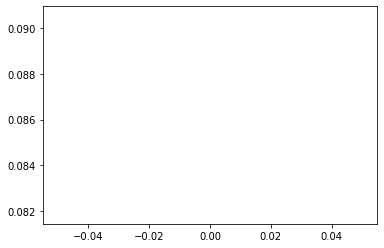

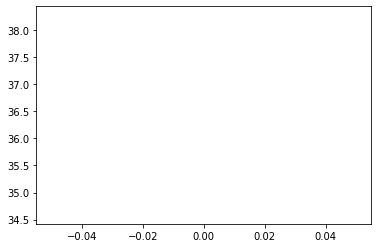



Test set: Average loss: 0.1572, Accuracy: 274/431 (64%)



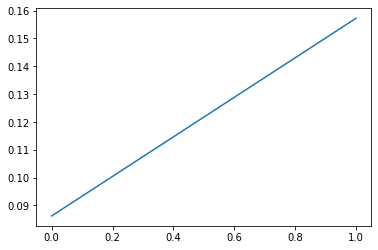

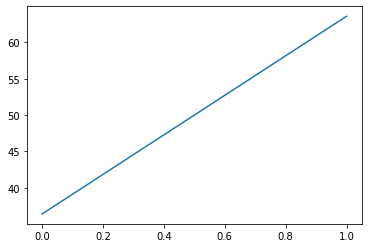



Test set: Average loss: 0.1150, Accuracy: 155/431 (36%)



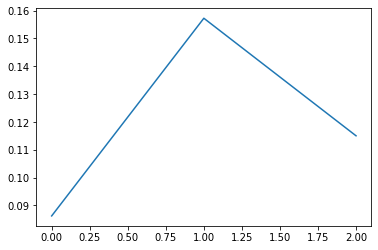

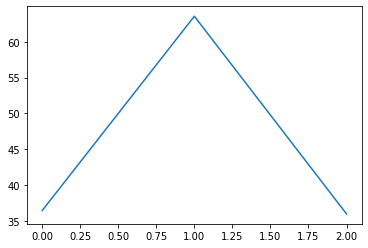



Test set: Average loss: 0.3832, Accuracy: 157/431 (36%)



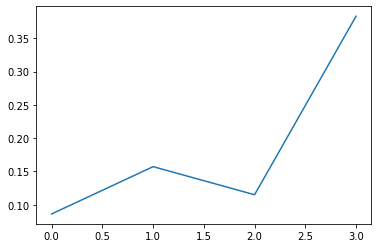

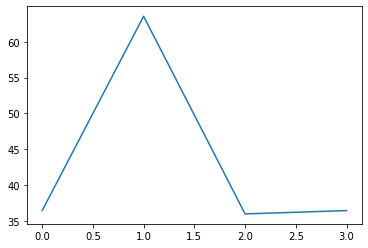



Test set: Average loss: 0.1210, Accuracy: 274/431 (64%)



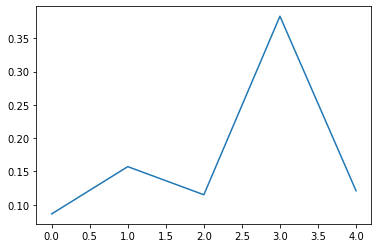

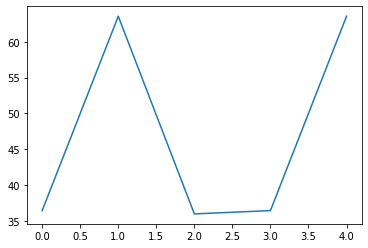



Test set: Average loss: 0.0473, Accuracy: 203/431 (47%)



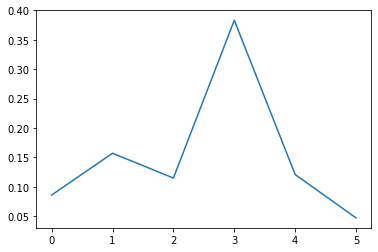

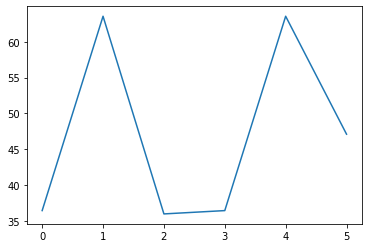



Test set: Average loss: 0.0167, Accuracy: 274/431 (64%)



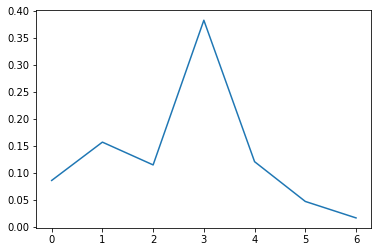

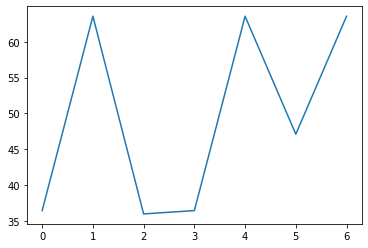



Test set: Average loss: 11.6248, Accuracy: 274/431 (64%)



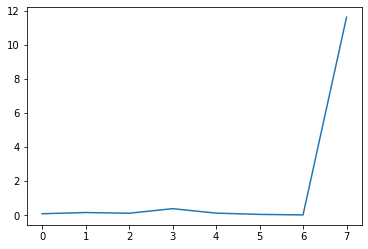

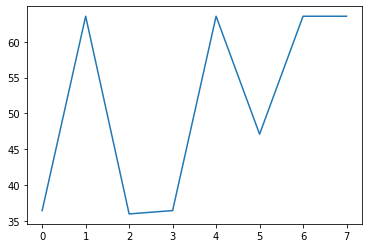



Test set: Average loss: 0.0069, Accuracy: 278/431 (65%)



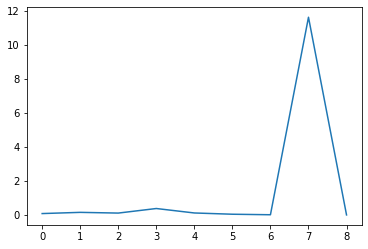

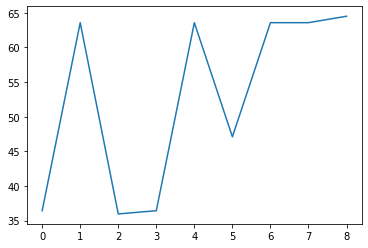



Test set: Average loss: 0.0063, Accuracy: 327/431 (76%)



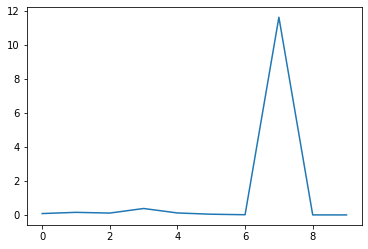

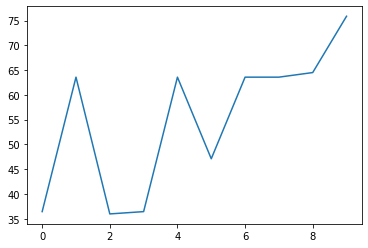



Test set: Average loss: 0.0062, Accuracy: 292/431 (68%)



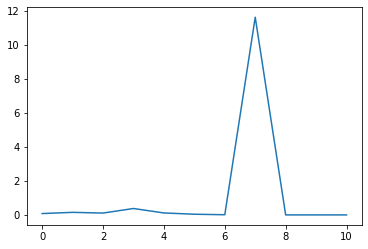

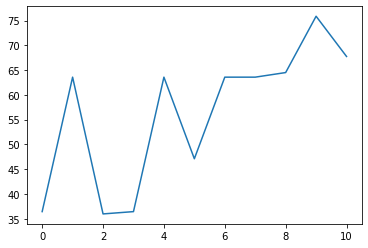



Test set: Average loss: 0.0066, Accuracy: 287/431 (67%)



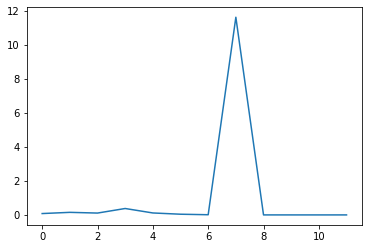

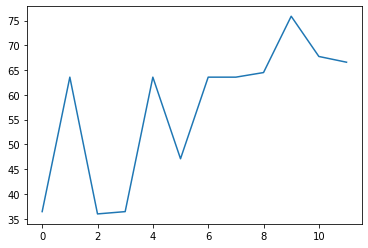



Test set: Average loss: 0.0061, Accuracy: 295/431 (68%)



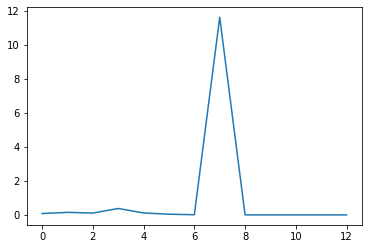

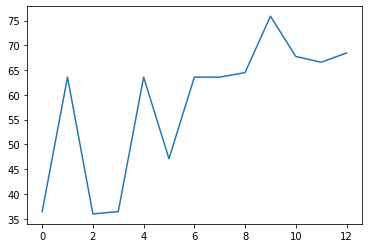



Test set: Average loss: 0.0066, Accuracy: 281/431 (65%)



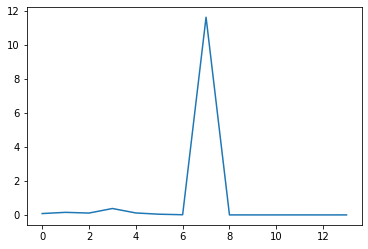

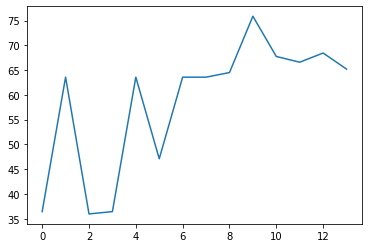



Test set: Average loss: 0.0072, Accuracy: 283/431 (66%)



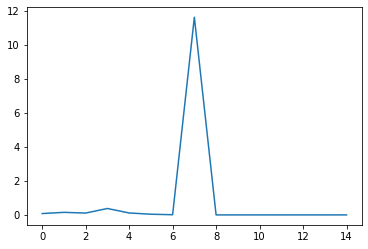

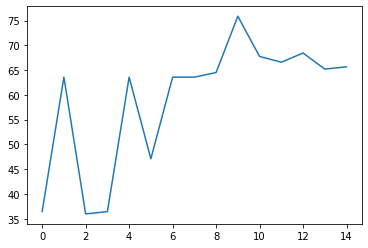



Test set: Average loss: 0.0065, Accuracy: 282/431 (65%)



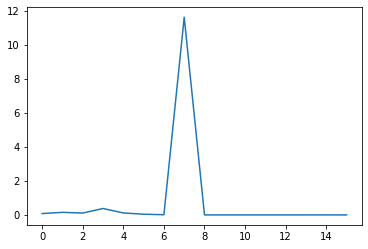

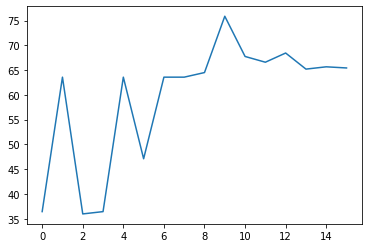



Test set: Average loss: 0.0081, Accuracy: 282/431 (65%)



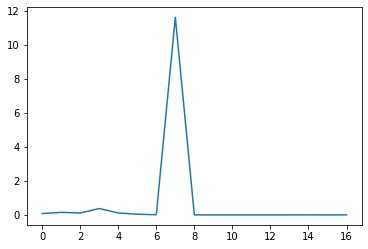

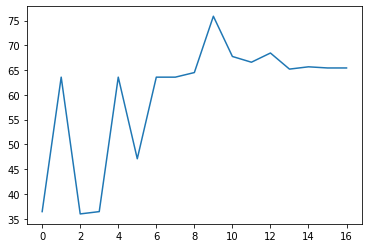



Test set: Average loss: 0.0073, Accuracy: 280/431 (65%)



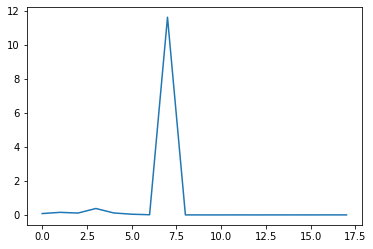

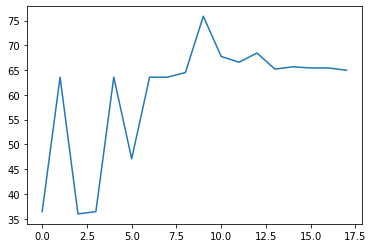



Test set: Average loss: 0.0071, Accuracy: 280/431 (65%)



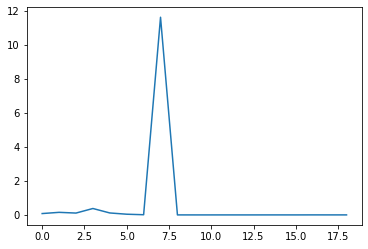

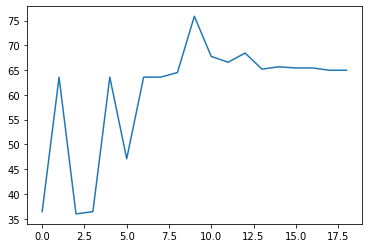



Test set: Average loss: 0.0071, Accuracy: 275/431 (64%)



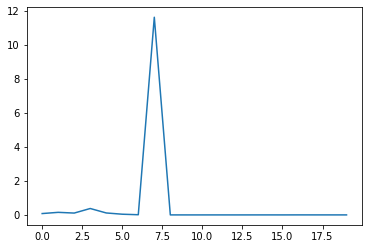

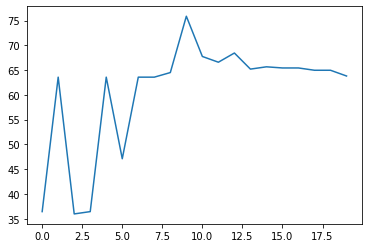



Test set: Average loss: 0.0071, Accuracy: 275/431 (64%)



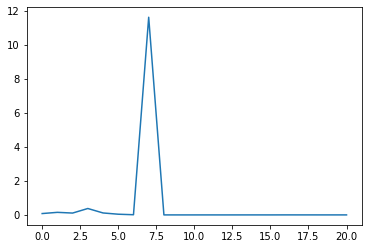

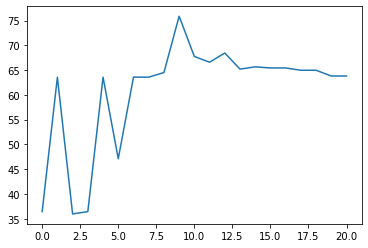



Test set: Average loss: 0.0060, Accuracy: 293/431 (68%)



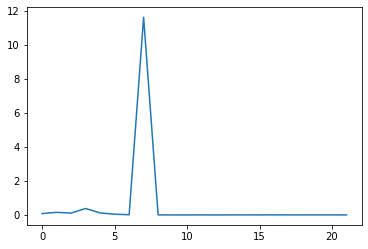

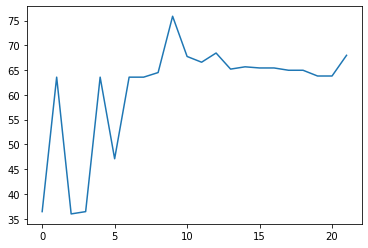



Test set: Average loss: 0.0070, Accuracy: 295/431 (68%)



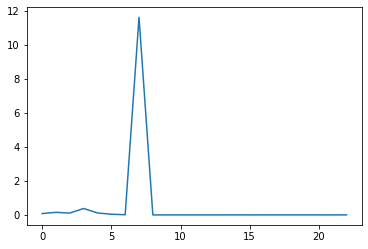

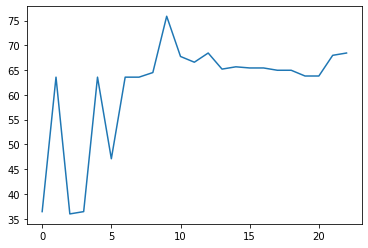



Test set: Average loss: 0.0082, Accuracy: 273/431 (63%)



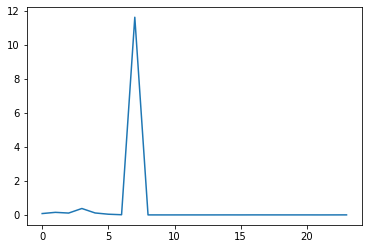

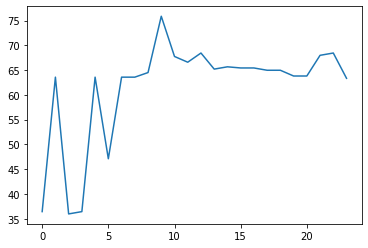



Test set: Average loss: 0.0077, Accuracy: 279/431 (65%)



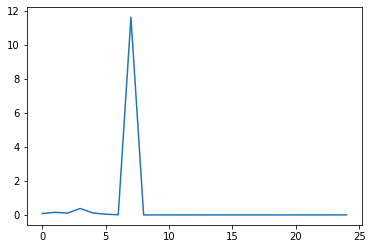

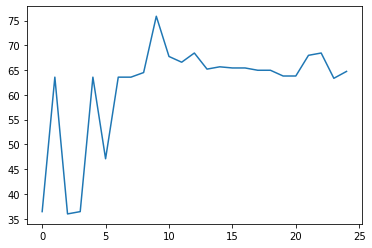



Test set: Average loss: 0.0075, Accuracy: 266/431 (62%)



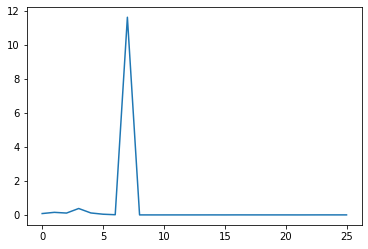

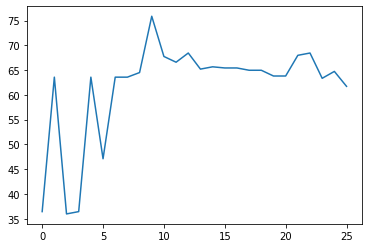



Test set: Average loss: 0.0072, Accuracy: 303/431 (70%)



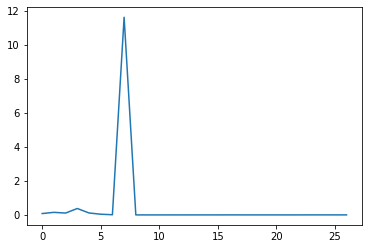

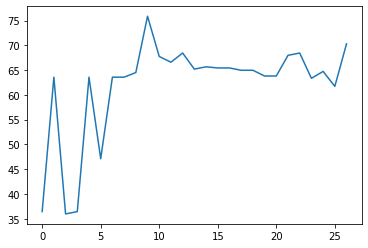



Test set: Average loss: 0.0071, Accuracy: 288/431 (67%)



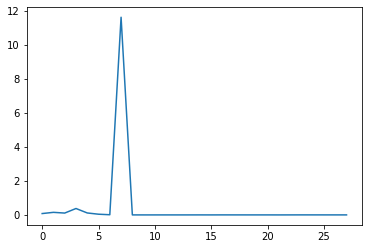

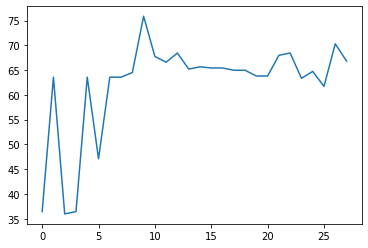



Test set: Average loss: 0.0070, Accuracy: 297/431 (69%)



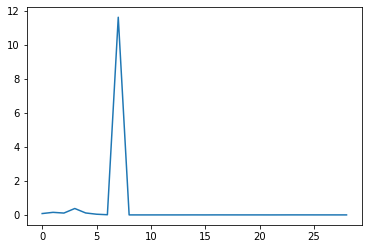

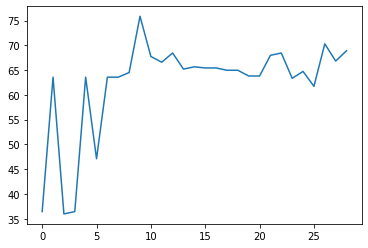



Test set: Average loss: 0.0068, Accuracy: 302/431 (70%)



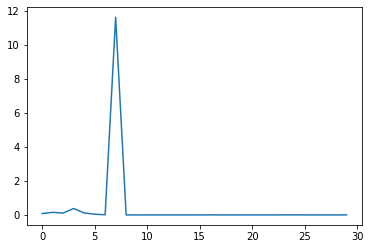

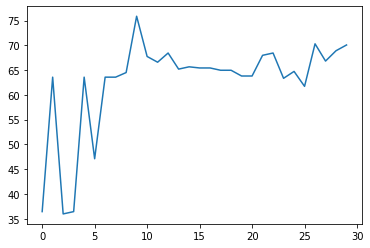



Test set: Average loss: 0.0069, Accuracy: 298/431 (69%)



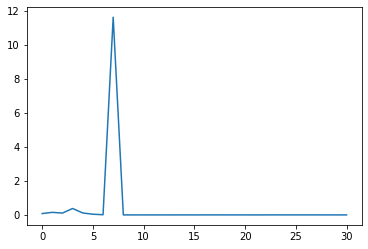

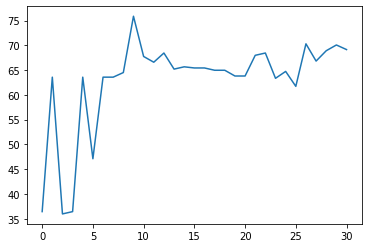



Test set: Average loss: 0.0069, Accuracy: 273/431 (63%)



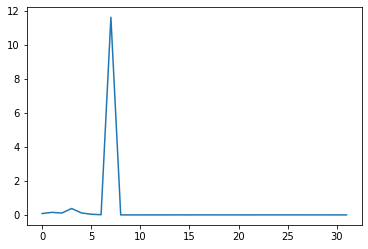

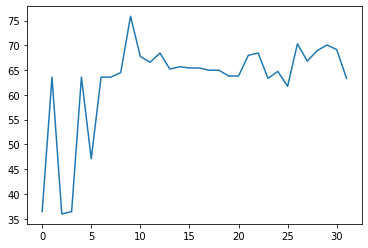



Test set: Average loss: 0.0065, Accuracy: 298/431 (69%)



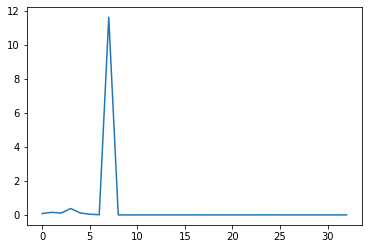

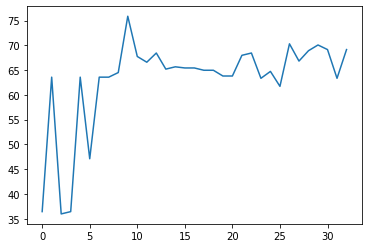



Test set: Average loss: 0.0067, Accuracy: 281/431 (65%)



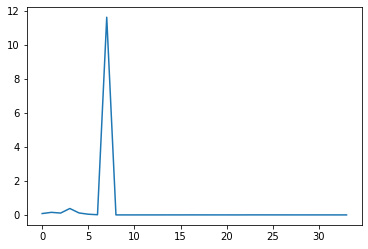

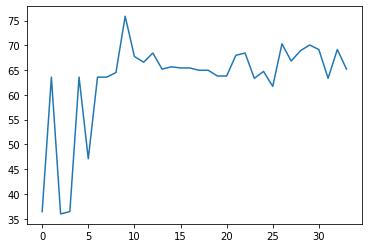



Test set: Average loss: 0.0075, Accuracy: 282/431 (65%)



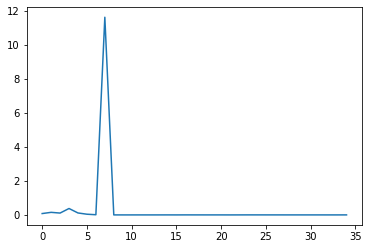

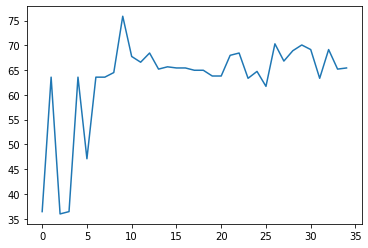



Test set: Average loss: 0.1842, Accuracy: 234/431 (54%)



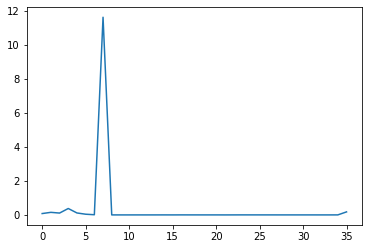

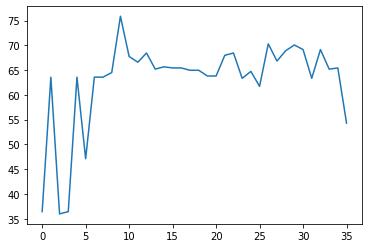



Test set: Average loss: 1.8283, Accuracy: 274/431 (64%)



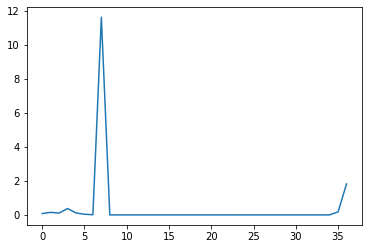

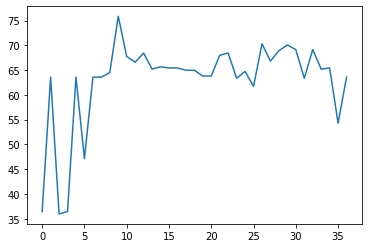



Test set: Average loss: 5.7736, Accuracy: 280/431 (65%)



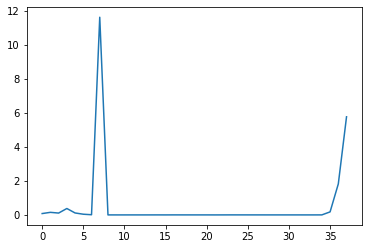

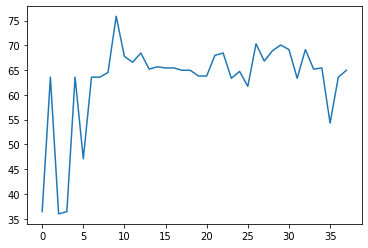



Test set: Average loss: 0.2154, Accuracy: 288/431 (67%)



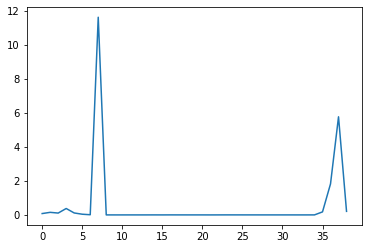

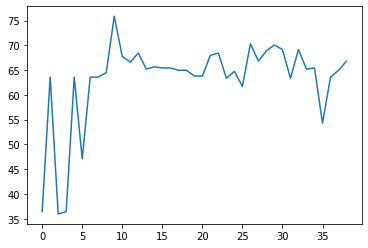



Test set: Average loss: 0.4586, Accuracy: 262/431 (61%)



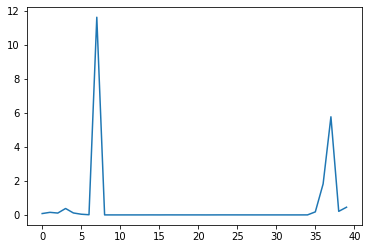

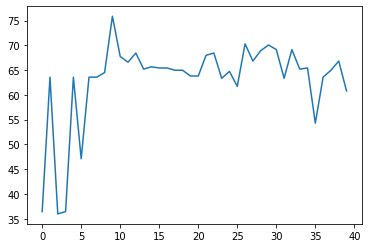



Test set: Average loss: 0.7903, Accuracy: 290/431 (67%)



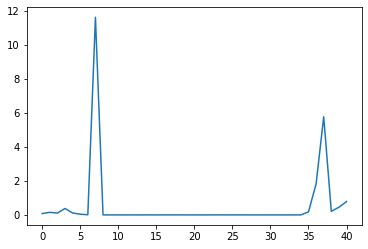

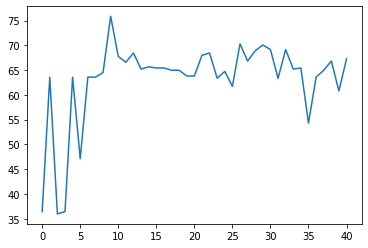



Test set: Average loss: 0.8091, Accuracy: 281/431 (65%)



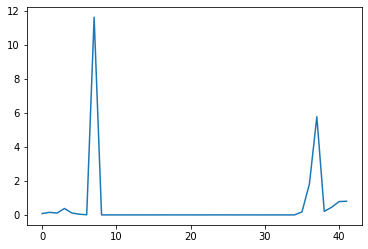

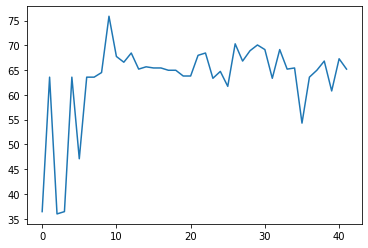



Test set: Average loss: 0.8472, Accuracy: 298/431 (69%)



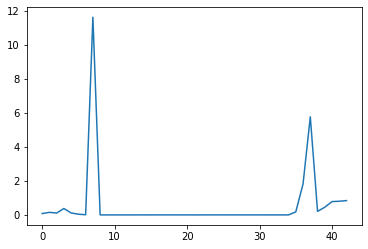

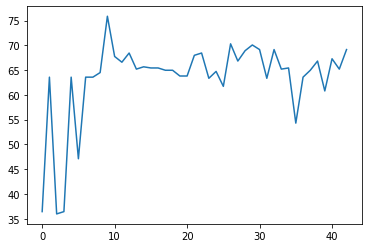



Test set: Average loss: 1.2228, Accuracy: 287/431 (67%)



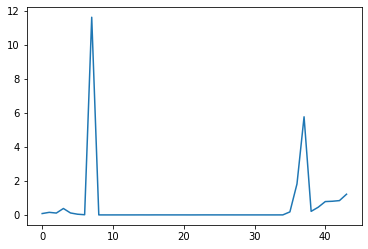

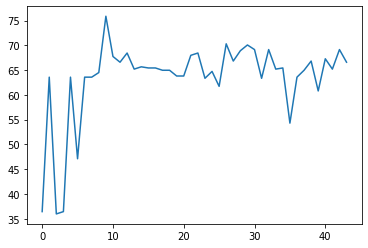



Test set: Average loss: 3.0342, Accuracy: 276/431 (64%)



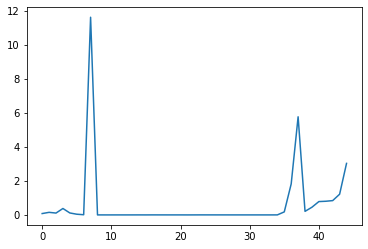

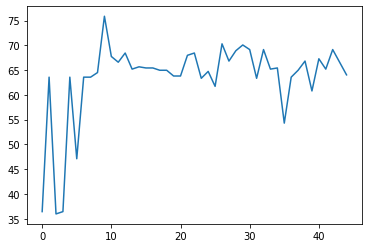



Test set: Average loss: 1.3768, Accuracy: 280/431 (65%)



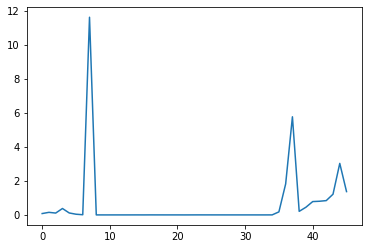

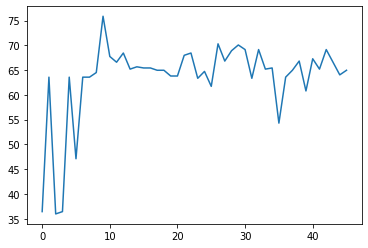



Test set: Average loss: 1.4514, Accuracy: 279/431 (65%)



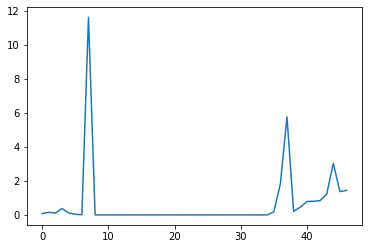

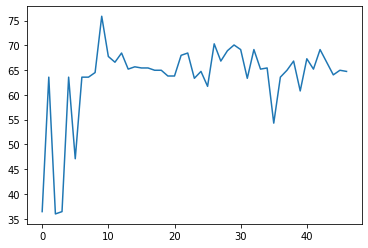



Test set: Average loss: 0.9389, Accuracy: 284/431 (66%)



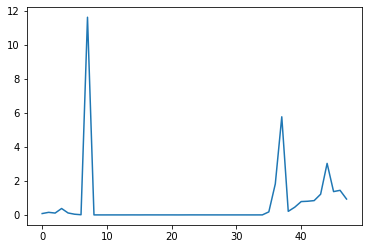

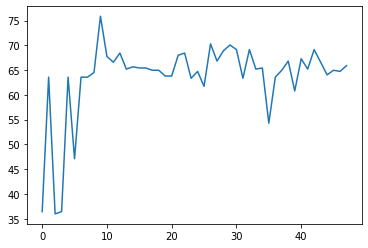



Test set: Average loss: 1.7830, Accuracy: 279/431 (65%)



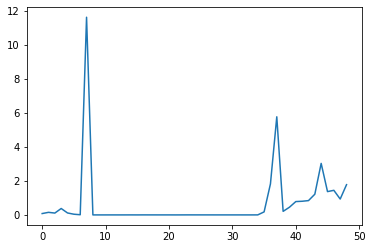

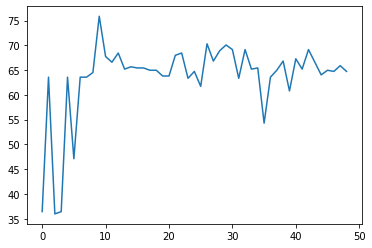



Test set: Average loss: 1.8154, Accuracy: 285/431 (66%)



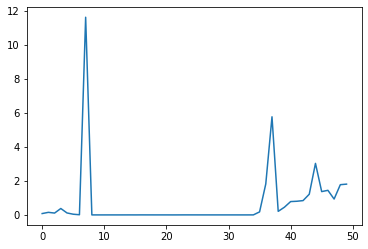

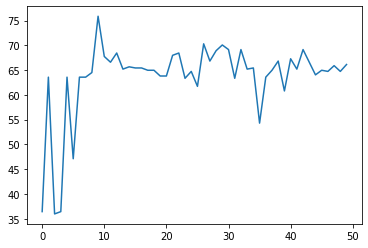



Test set: Average loss: 2.1565, Accuracy: 284/431 (66%)



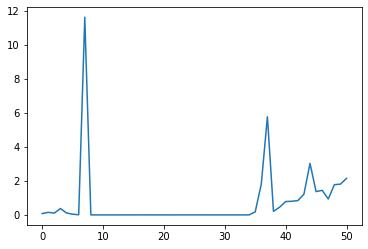

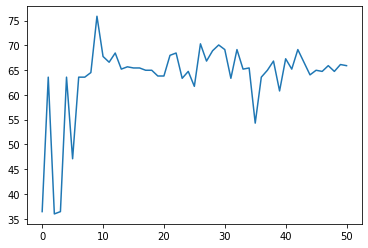



Test set: Average loss: 1.4739, Accuracy: 287/431 (67%)



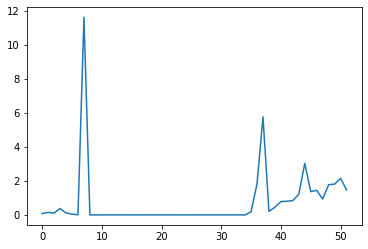

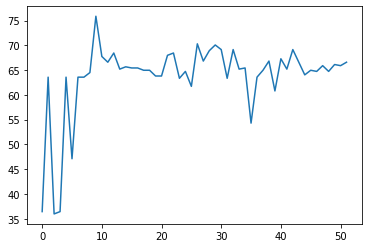



Test set: Average loss: 1.7615, Accuracy: 291/431 (68%)



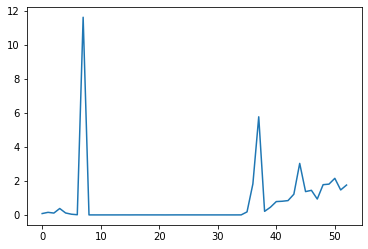

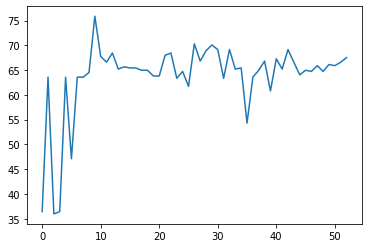



Test set: Average loss: 1.9665, Accuracy: 296/431 (69%)



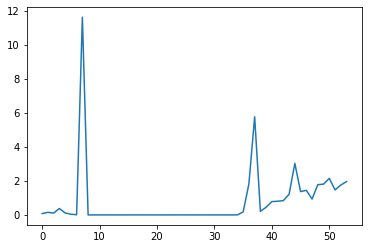

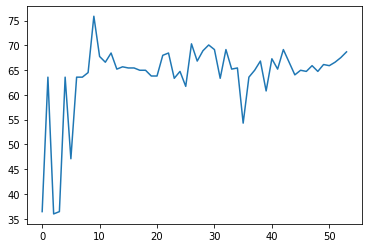



Test set: Average loss: 2.1731, Accuracy: 296/431 (69%)



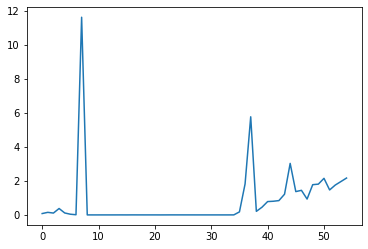

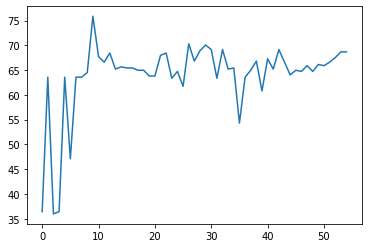



Test set: Average loss: 1.6158, Accuracy: 291/431 (68%)



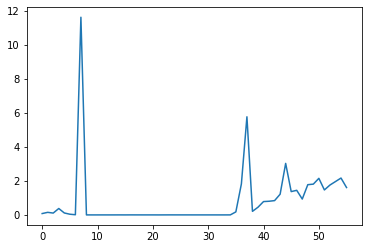

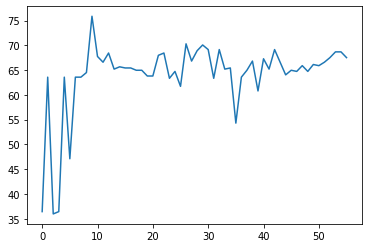



Test set: Average loss: 2.6106, Accuracy: 286/431 (66%)



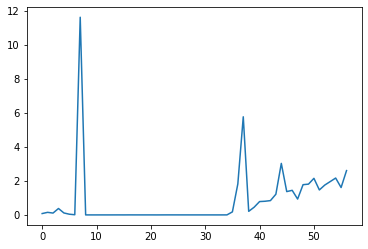

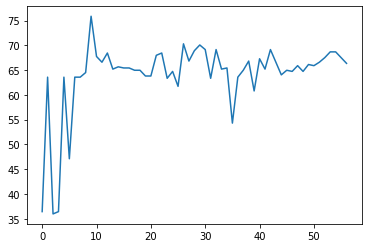



Test set: Average loss: 1.1459, Accuracy: 290/431 (67%)



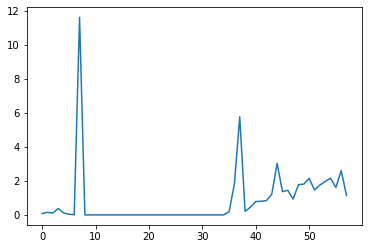

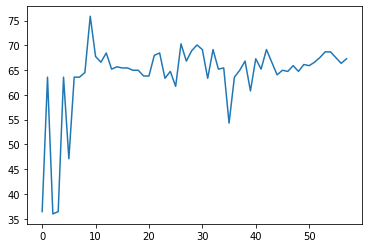



Test set: Average loss: 1.1009, Accuracy: 299/431 (69%)



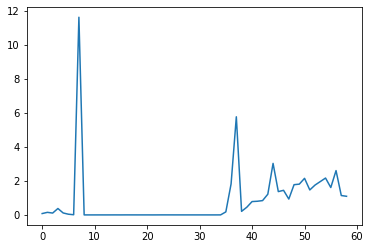

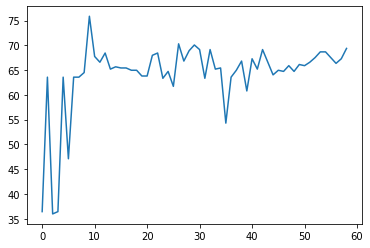



Test set: Average loss: 2.6300, Accuracy: 296/431 (69%)



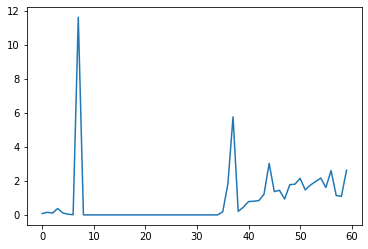

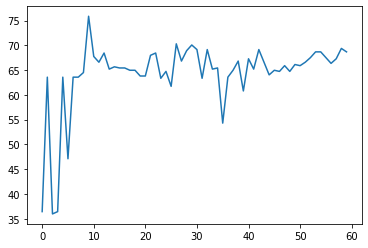



Test set: Average loss: 2.0513, Accuracy: 298/431 (69%)



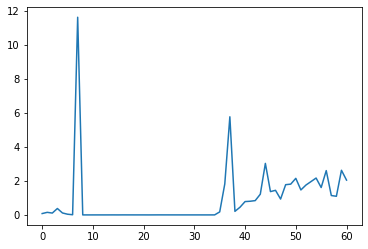

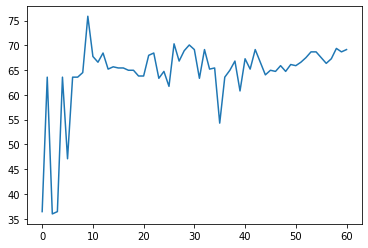



Test set: Average loss: 2.2536, Accuracy: 290/431 (67%)



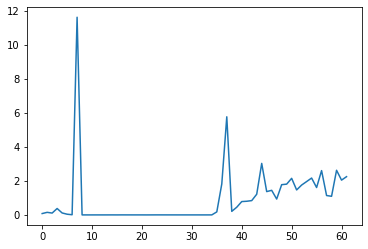

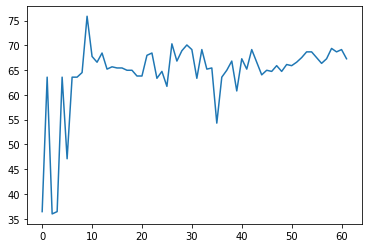



Test set: Average loss: 1.1255, Accuracy: 304/431 (71%)



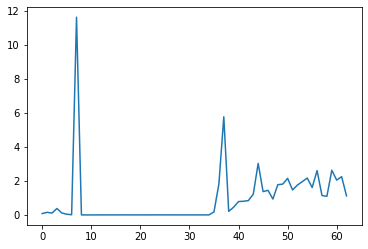

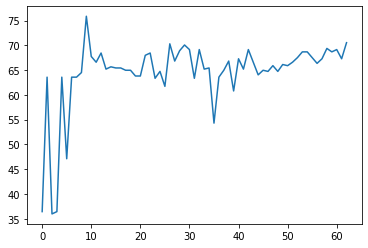



Test set: Average loss: 1.0173, Accuracy: 304/431 (71%)



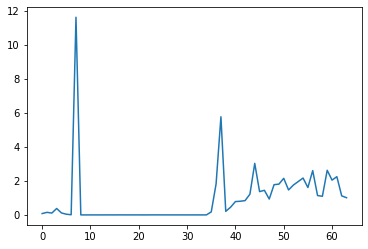

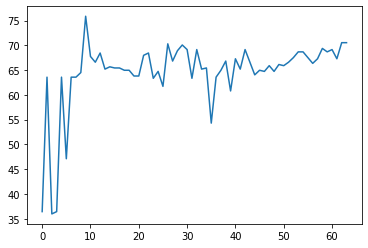



Test set: Average loss: 0.9655, Accuracy: 306/431 (71%)



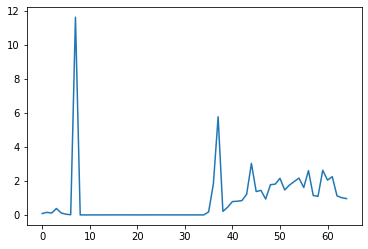

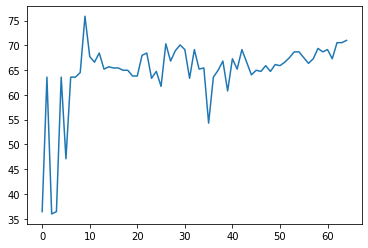



Test set: Average loss: 1.2416, Accuracy: 305/431 (71%)



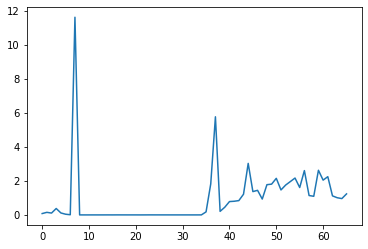

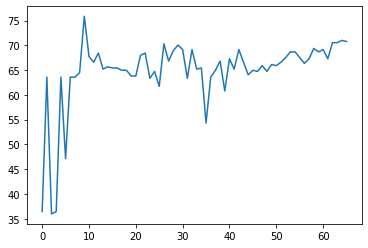



Test set: Average loss: 1.4095, Accuracy: 307/431 (71%)



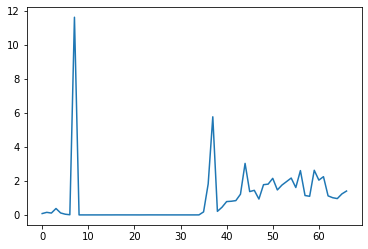

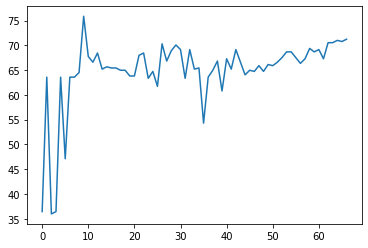



Test set: Average loss: 1.1382, Accuracy: 308/431 (71%)



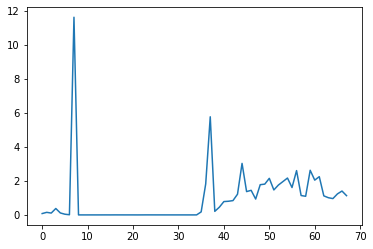

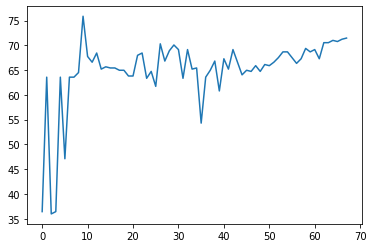



Test set: Average loss: 2.0274, Accuracy: 304/431 (71%)



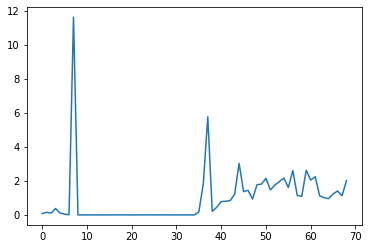

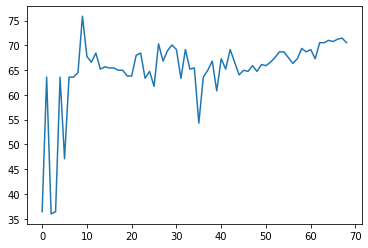



Test set: Average loss: 0.7094, Accuracy: 312/431 (72%)



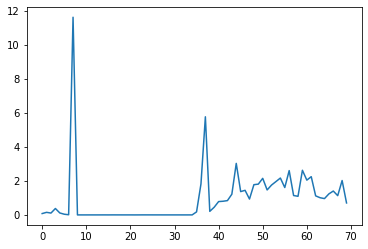

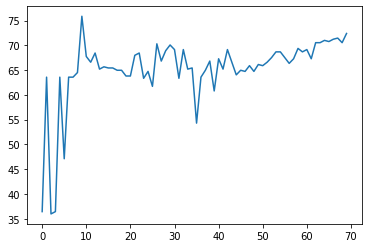



Test set: Average loss: 0.7069, Accuracy: 313/431 (73%)



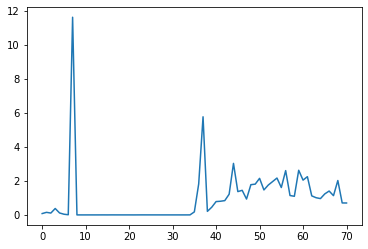

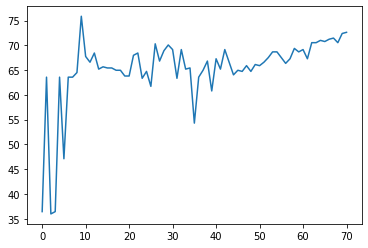



Test set: Average loss: 1.0086, Accuracy: 318/431 (74%)



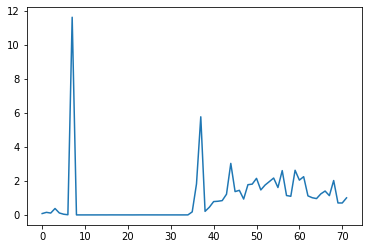

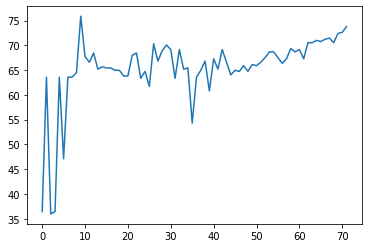



Test set: Average loss: 0.8582, Accuracy: 312/431 (72%)



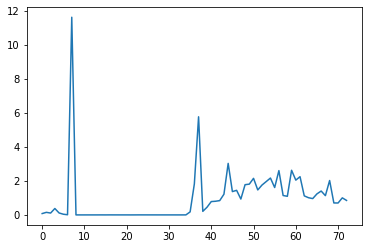

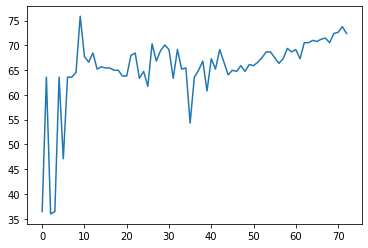



Test set: Average loss: 1.3694, Accuracy: 312/431 (72%)



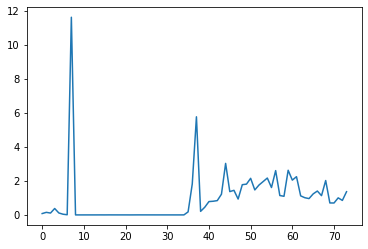

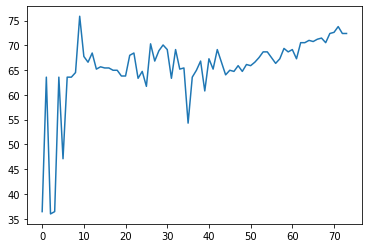



Test set: Average loss: 0.4856, Accuracy: 329/431 (76%)



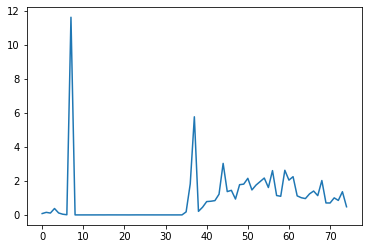

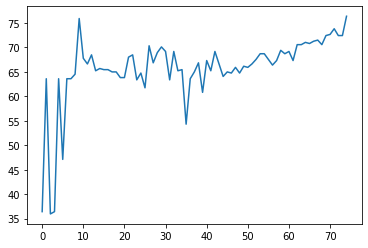



Test set: Average loss: 3.0603, Accuracy: 294/431 (68%)



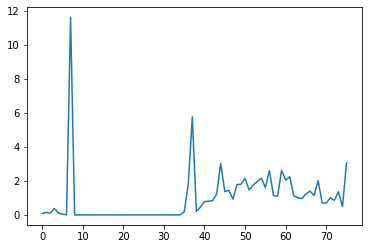

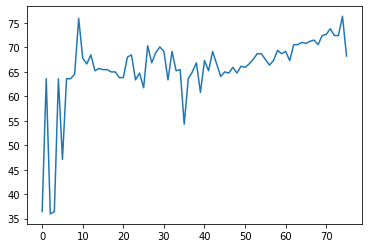



Test set: Average loss: 0.7613, Accuracy: 305/431 (71%)



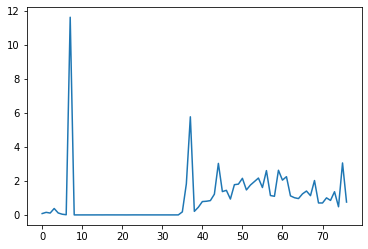

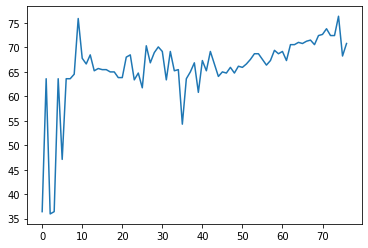



Test set: Average loss: 0.9999, Accuracy: 314/431 (73%)



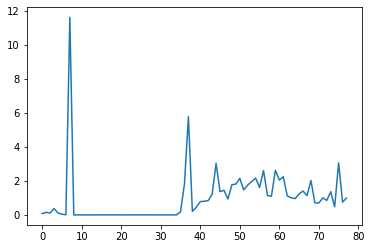

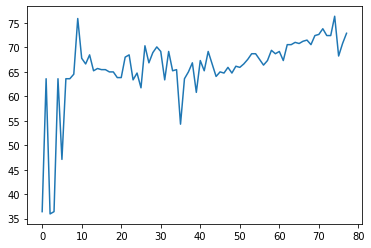



Test set: Average loss: 1.4426, Accuracy: 308/431 (71%)



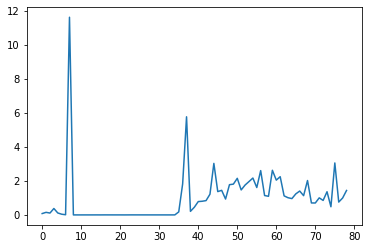

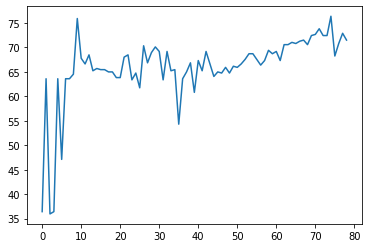



Test set: Average loss: 1.3376, Accuracy: 310/431 (72%)



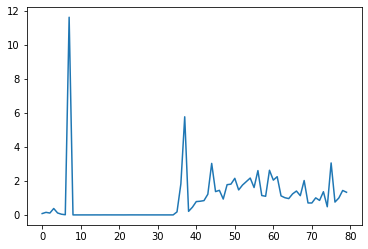

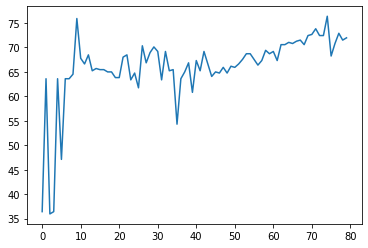



Test set: Average loss: 1.9344, Accuracy: 314/431 (73%)



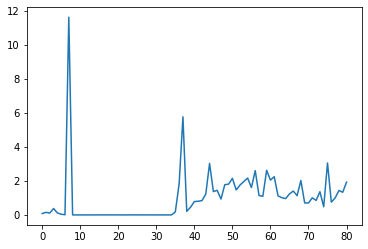

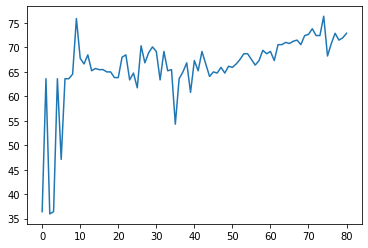



Test set: Average loss: 1.2480, Accuracy: 309/431 (72%)



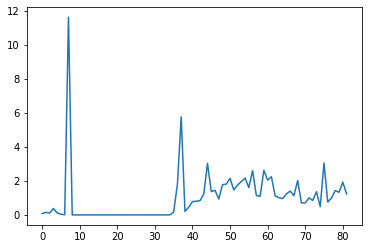

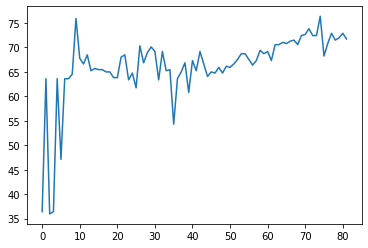



Test set: Average loss: 2.7647, Accuracy: 304/431 (71%)



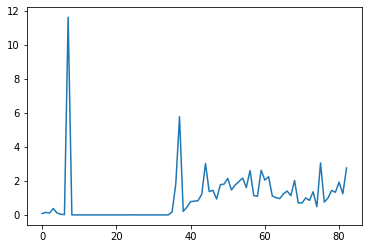

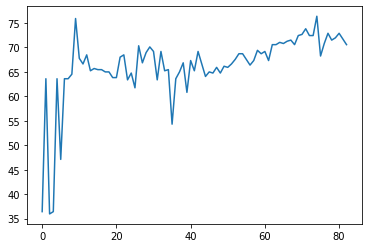



Test set: Average loss: 1.3896, Accuracy: 310/431 (72%)



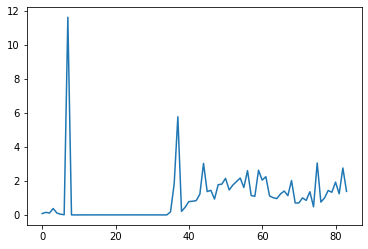

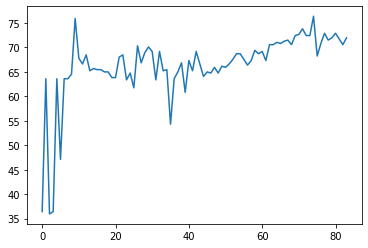



Test set: Average loss: 1.0165, Accuracy: 314/431 (73%)



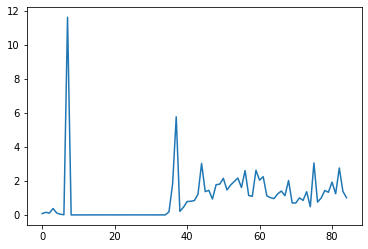

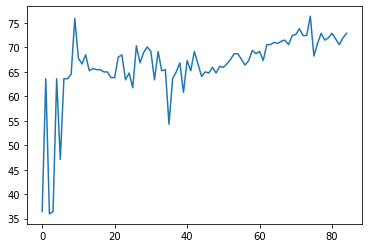



Test set: Average loss: 0.2554, Accuracy: 314/431 (73%)



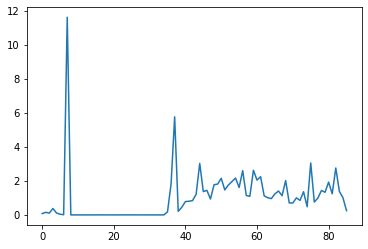

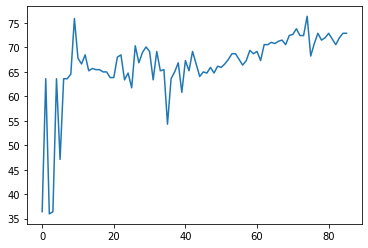



Test set: Average loss: 1.3692, Accuracy: 302/431 (70%)



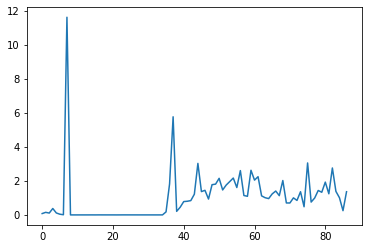

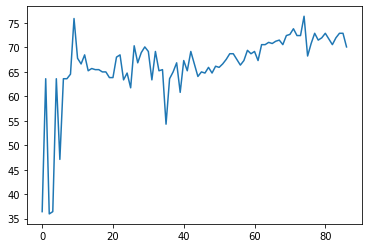



Test set: Average loss: 1.3532, Accuracy: 316/431 (73%)



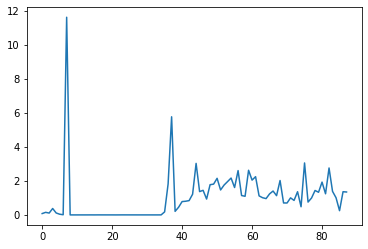

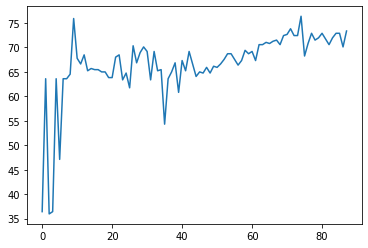



Test set: Average loss: 1.2820, Accuracy: 314/431 (73%)



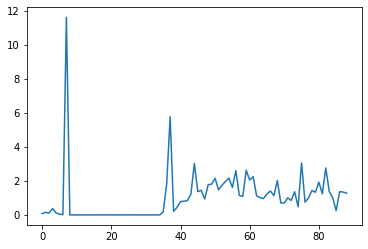

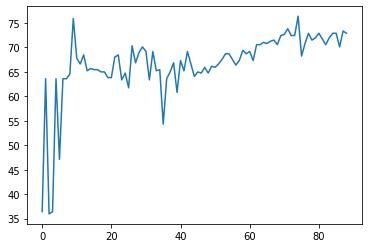



Test set: Average loss: 1.2071, Accuracy: 318/431 (74%)



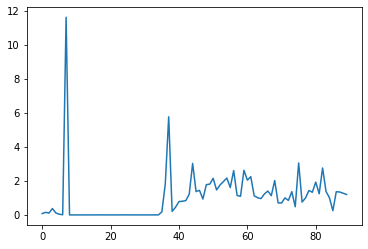

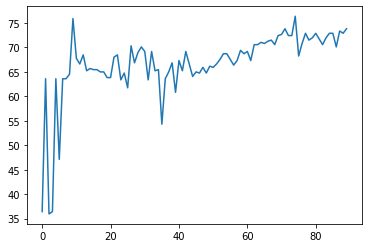



Test set: Average loss: 1.4024, Accuracy: 312/431 (72%)



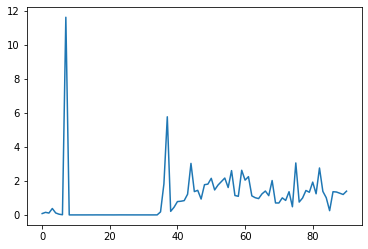

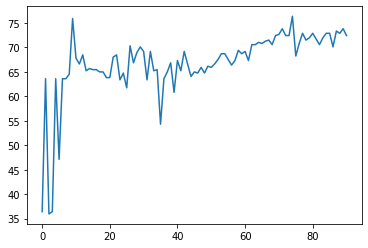



Test set: Average loss: 2.5114, Accuracy: 301/431 (70%)



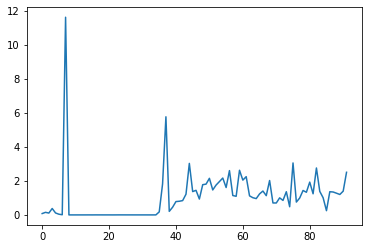

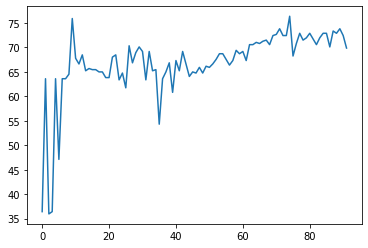



Test set: Average loss: 1.5194, Accuracy: 309/431 (72%)



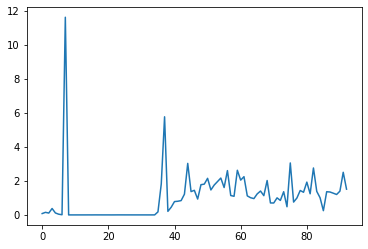

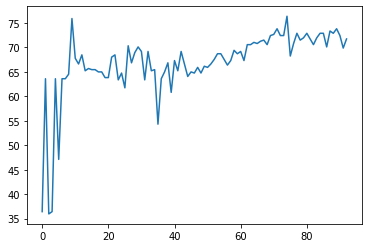



Test set: Average loss: 2.1935, Accuracy: 304/431 (71%)



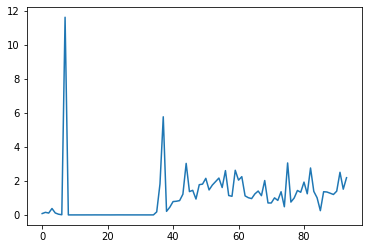

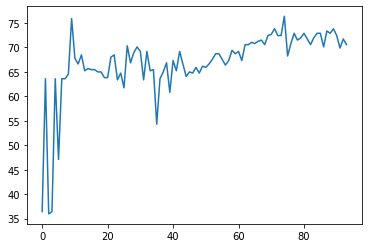



Test set: Average loss: 0.5551, Accuracy: 302/431 (70%)



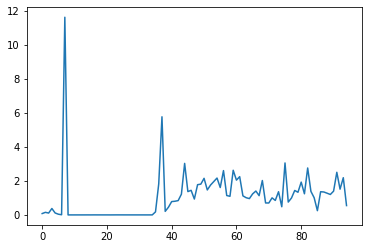

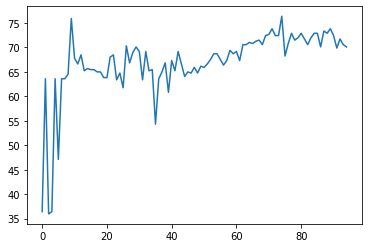



Test set: Average loss: 0.7458, Accuracy: 314/431 (73%)



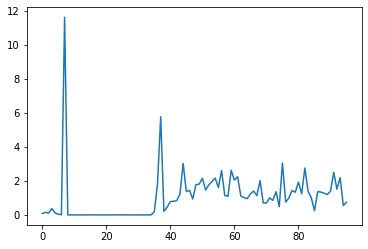

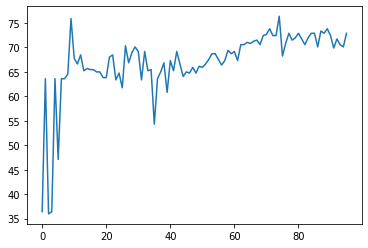



Test set: Average loss: 2.0768, Accuracy: 303/431 (70%)



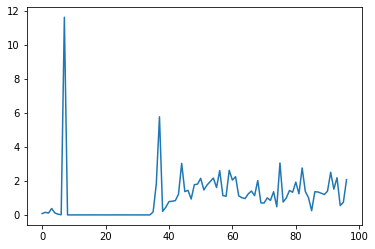

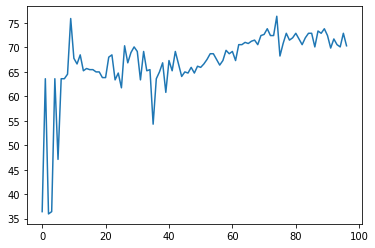



Test set: Average loss: 0.6067, Accuracy: 317/431 (74%)



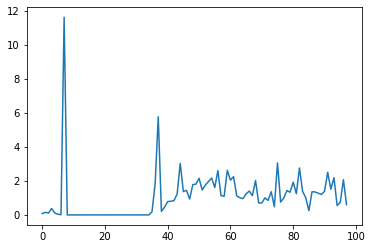

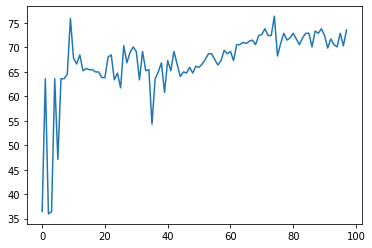



Test set: Average loss: 0.7980, Accuracy: 326/431 (76%)



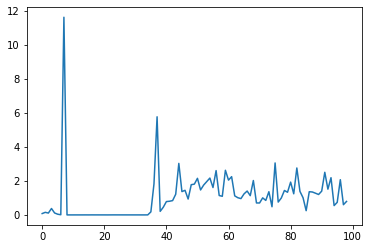

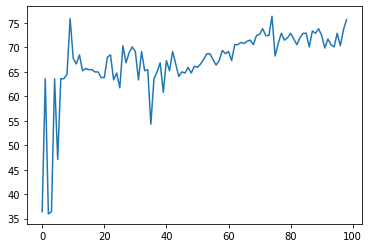



Test set: Average loss: 1.2670, Accuracy: 316/431 (73%)



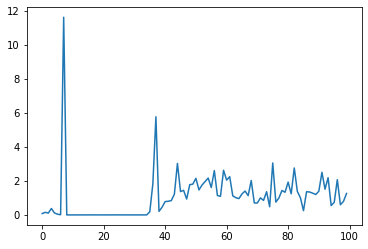

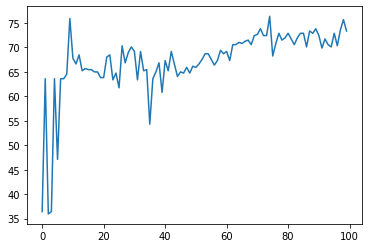



Test set: Average loss: 1.0551, Accuracy: 318/431 (74%)



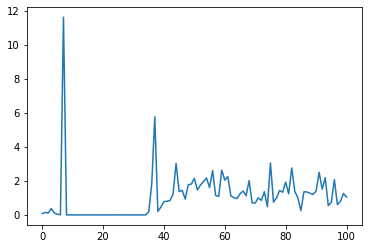

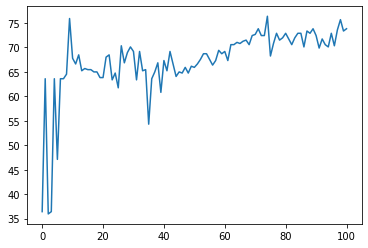



Test set: Average loss: 1.0870, Accuracy: 322/431 (75%)



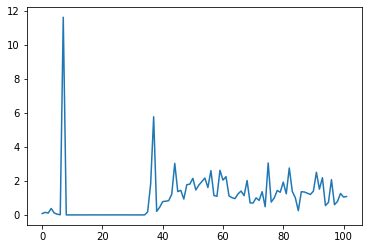

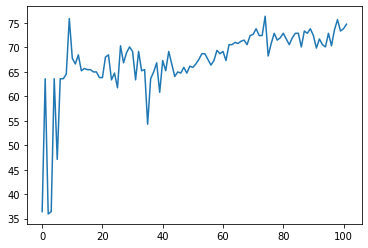



Test set: Average loss: 0.4467, Accuracy: 335/431 (78%)



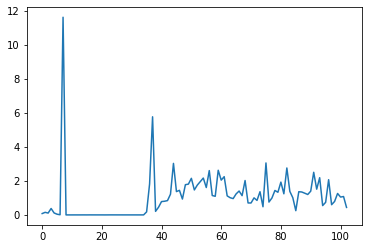

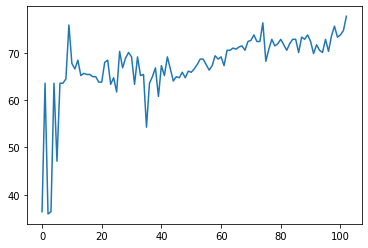



Test set: Average loss: 1.1541, Accuracy: 320/431 (74%)



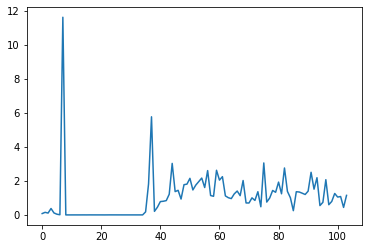

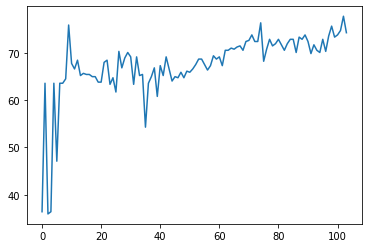



Test set: Average loss: 0.6183, Accuracy: 325/431 (75%)



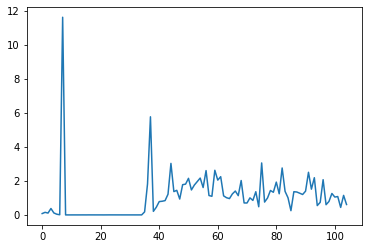

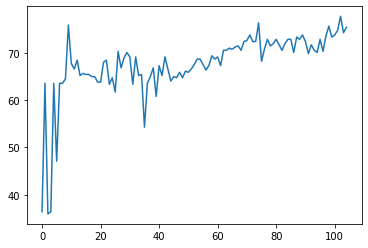



Test set: Average loss: 1.4408, Accuracy: 310/431 (72%)



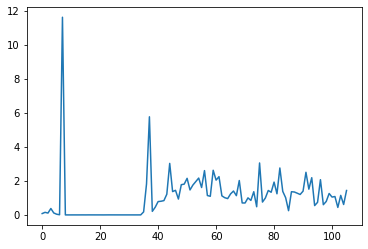

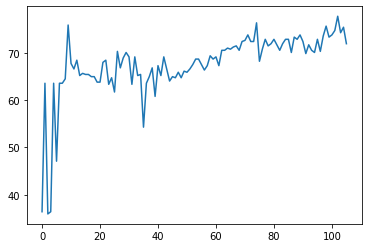



Test set: Average loss: 0.7673, Accuracy: 331/431 (77%)



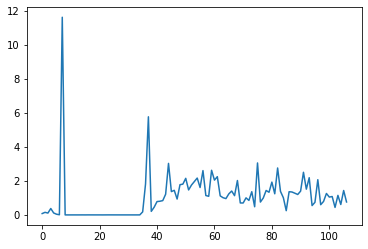

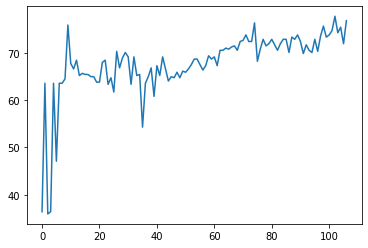



Test set: Average loss: 1.6606, Accuracy: 321/431 (74%)



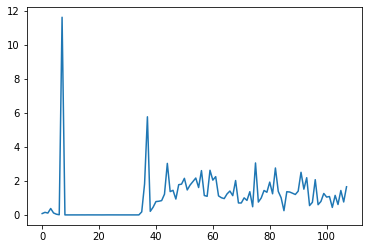

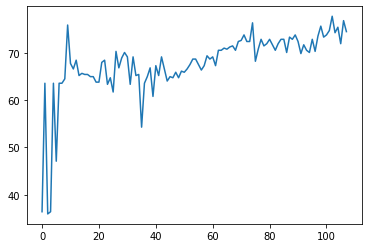



Test set: Average loss: 1.0268, Accuracy: 334/431 (77%)



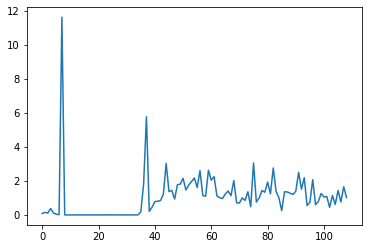

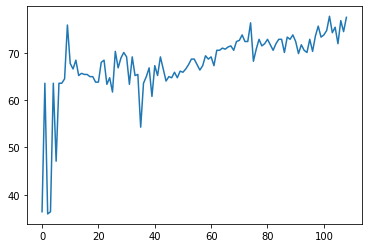



Test set: Average loss: 0.7372, Accuracy: 325/431 (75%)



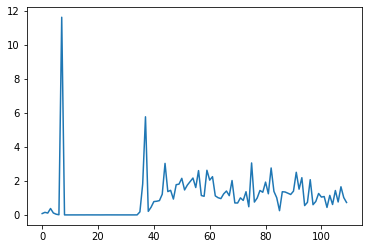

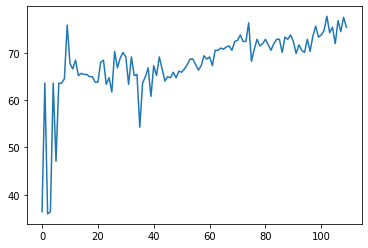



Test set: Average loss: 1.5575, Accuracy: 327/431 (76%)



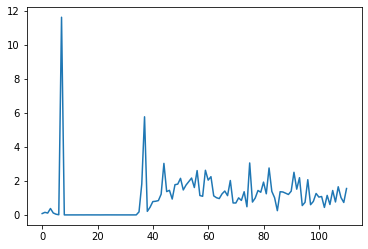

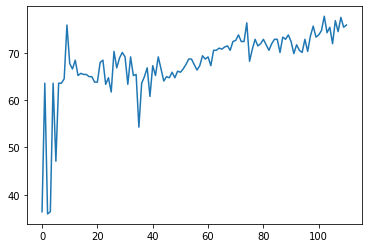



Test set: Average loss: 0.9341, Accuracy: 329/431 (76%)



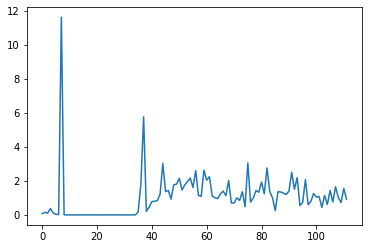

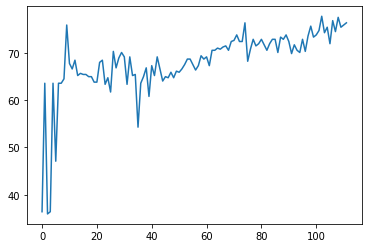



Test set: Average loss: 0.6889, Accuracy: 333/431 (77%)



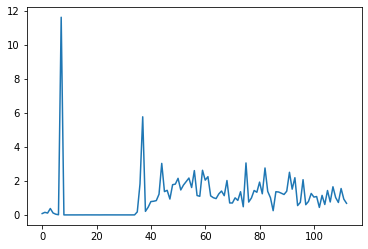

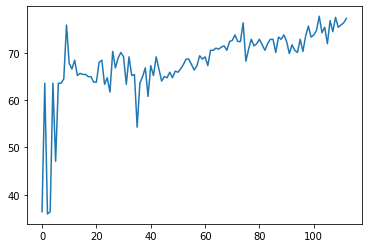



Test set: Average loss: 1.4096, Accuracy: 325/431 (75%)



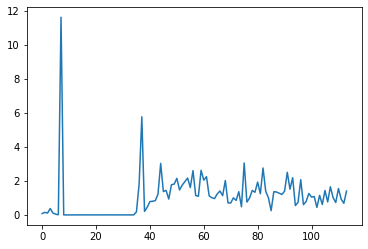

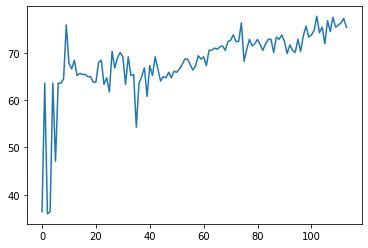



Test set: Average loss: 0.7554, Accuracy: 328/431 (76%)



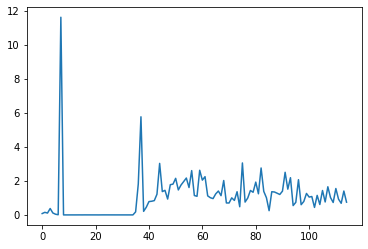

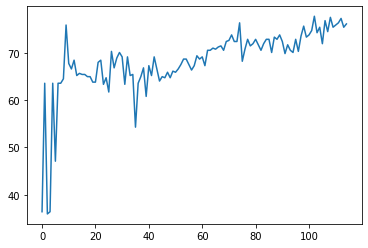



Test set: Average loss: 1.1035, Accuracy: 333/431 (77%)



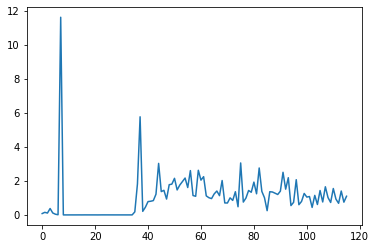

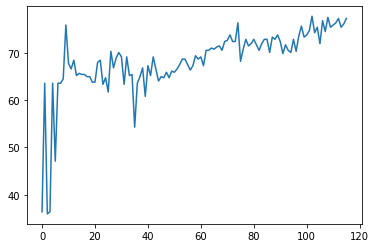



Test set: Average loss: 0.4722, Accuracy: 322/431 (75%)



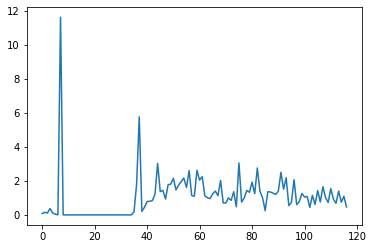

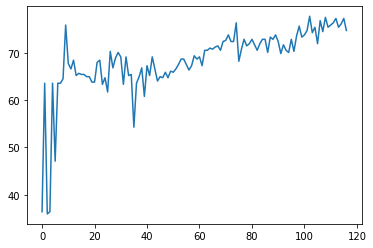



Test set: Average loss: 0.6724, Accuracy: 333/431 (77%)



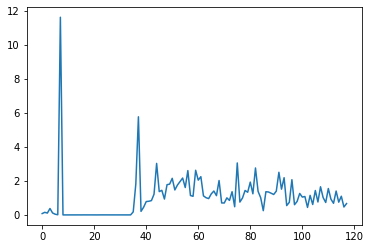

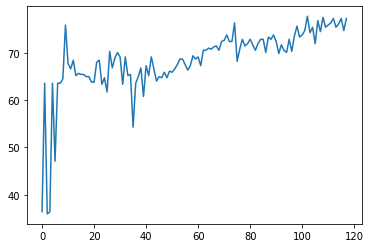



Test set: Average loss: 0.5392, Accuracy: 322/431 (75%)



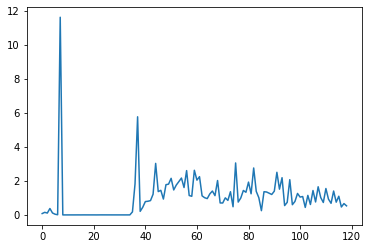

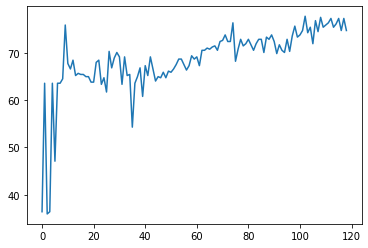



Test set: Average loss: 0.7520, Accuracy: 337/431 (78%)



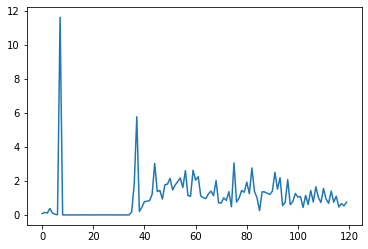

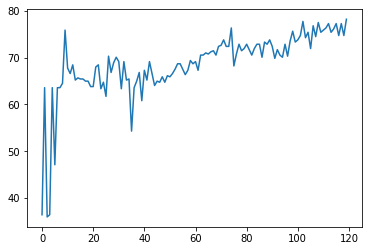



Test set: Average loss: 0.2268, Accuracy: 341/431 (79%)



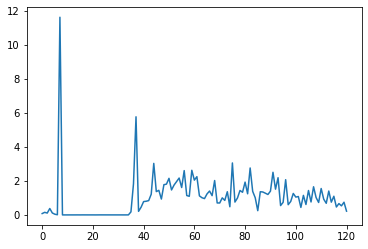

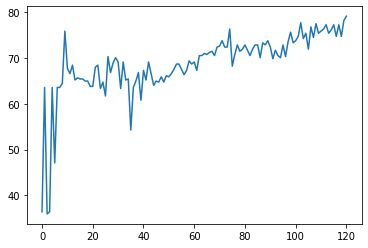



Test set: Average loss: 0.6862, Accuracy: 336/431 (78%)



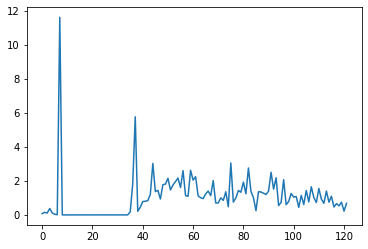

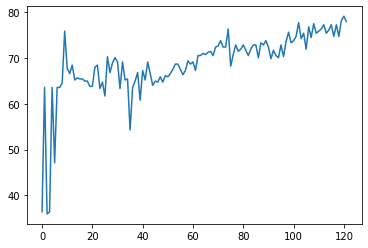



Test set: Average loss: 1.1426, Accuracy: 336/431 (78%)



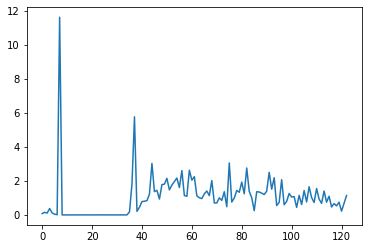

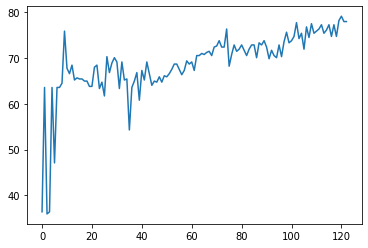



Test set: Average loss: 1.2303, Accuracy: 337/431 (78%)



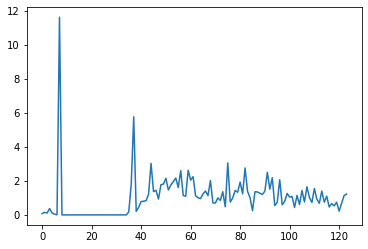

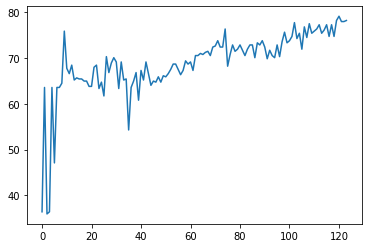



Test set: Average loss: 1.0909, Accuracy: 340/431 (79%)



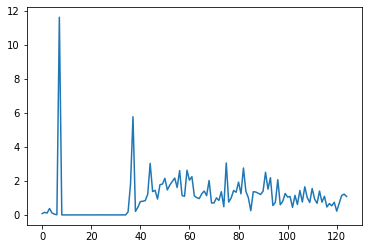

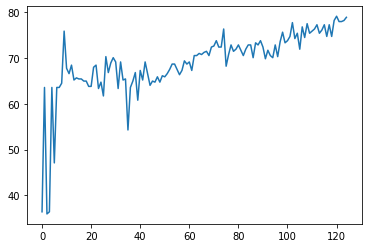



Test set: Average loss: 0.9755, Accuracy: 337/431 (78%)



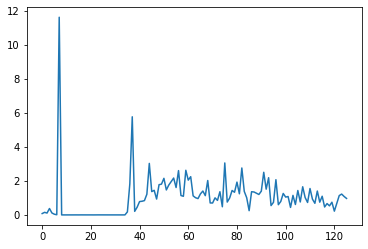

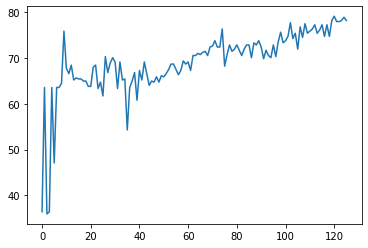



Test set: Average loss: 1.0062, Accuracy: 335/431 (78%)



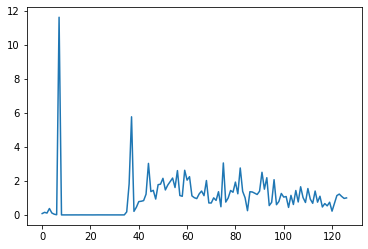

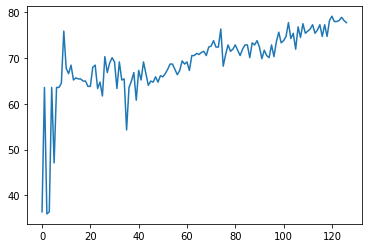



Test set: Average loss: 0.7516, Accuracy: 342/431 (79%)



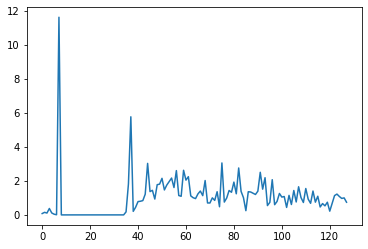

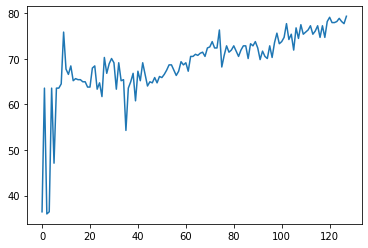



Test set: Average loss: 0.1519, Accuracy: 342/431 (79%)



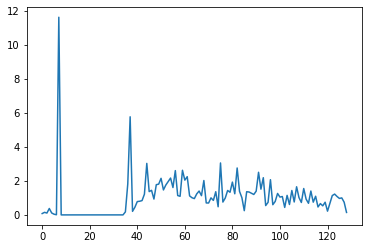

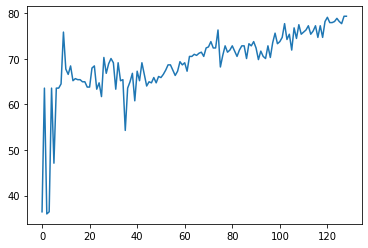



Test set: Average loss: 0.0194, Accuracy: 183/431 (42%)



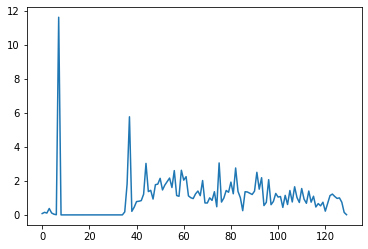

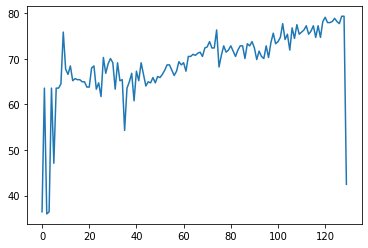



Test set: Average loss: 0.0063, Accuracy: 313/431 (73%)



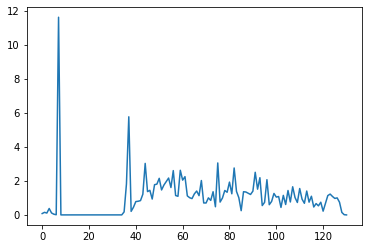

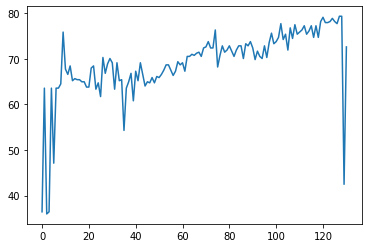



Test set: Average loss: 0.0057, Accuracy: 332/431 (77%)



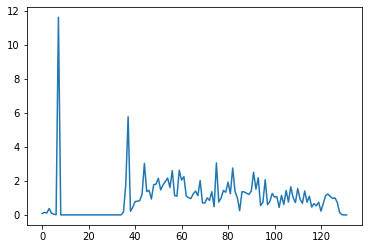

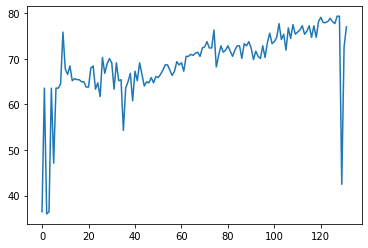



Test set: Average loss: 0.0053, Accuracy: 342/431 (79%)



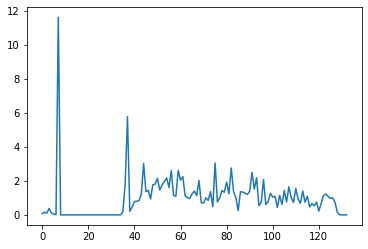

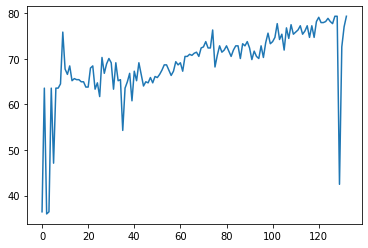



Test set: Average loss: 0.0048, Accuracy: 355/431 (82%)



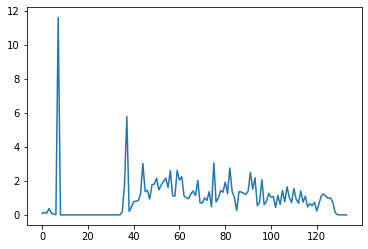

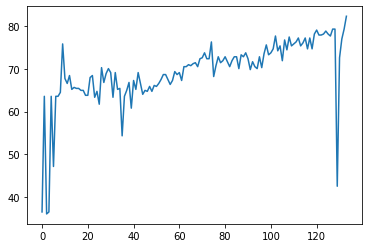



Test set: Average loss: 0.0054, Accuracy: 317/431 (74%)



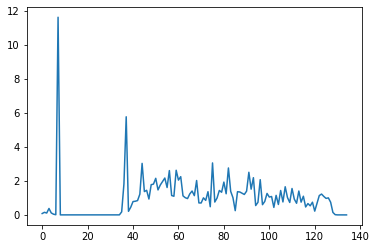

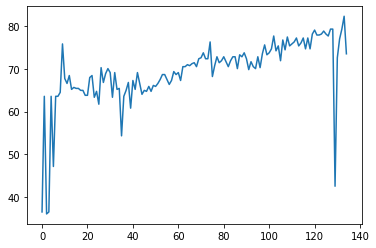



Test set: Average loss: 0.0042, Accuracy: 360/431 (84%)



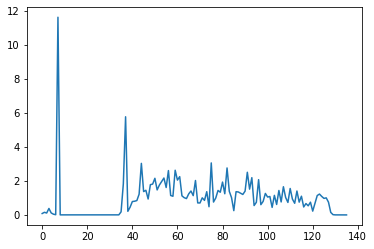

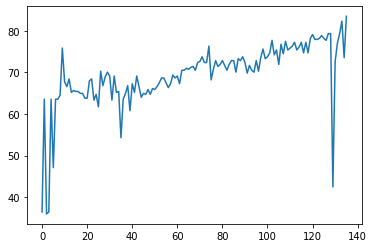



Test set: Average loss: 0.0056, Accuracy: 338/431 (78%)



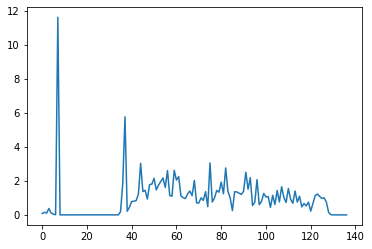

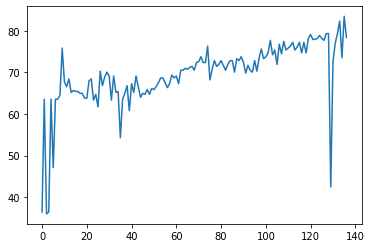



Test set: Average loss: 0.0029, Accuracy: 390/431 (90%)



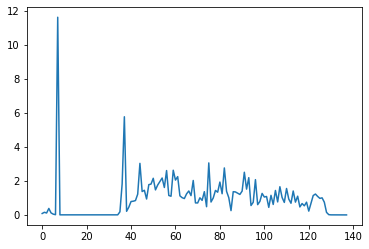

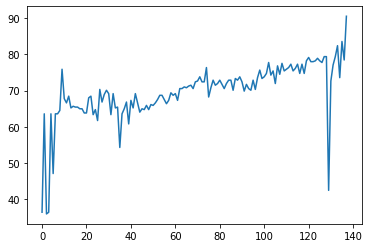



Test set: Average loss: 0.0045, Accuracy: 359/431 (83%)



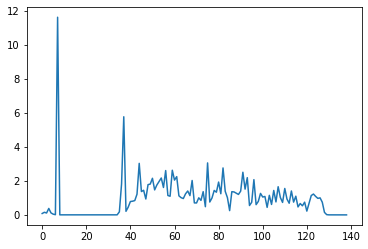

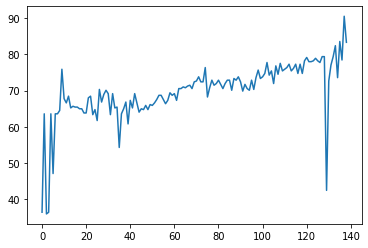



Test set: Average loss: 0.0031, Accuracy: 395/431 (92%)



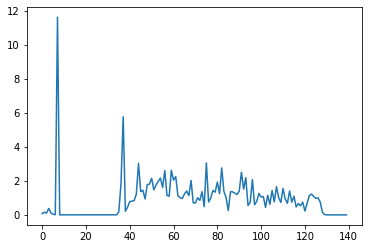

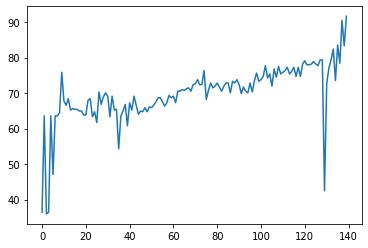



Test set: Average loss: 0.0032, Accuracy: 382/431 (89%)



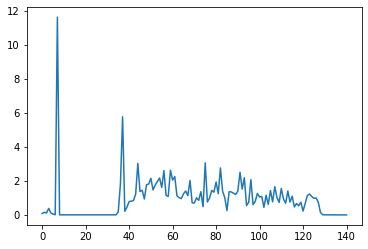

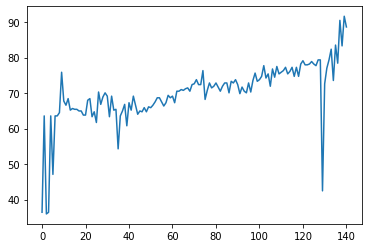



Test set: Average loss: 0.0039, Accuracy: 366/431 (85%)



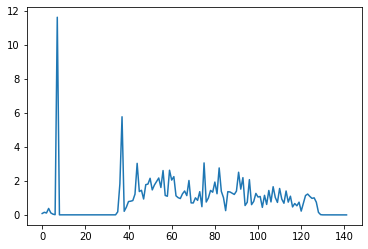

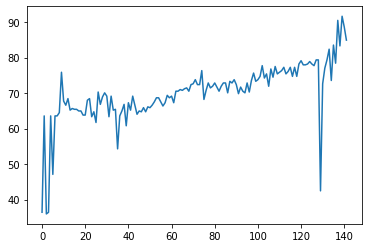



Test set: Average loss: 0.0038, Accuracy: 380/431 (88%)



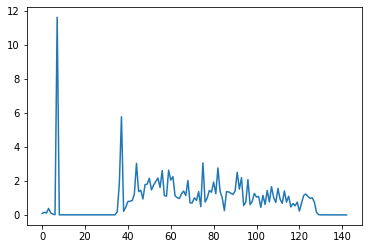

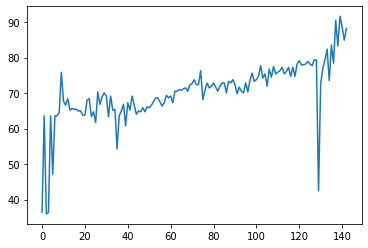



Test set: Average loss: 0.0028, Accuracy: 388/431 (90%)



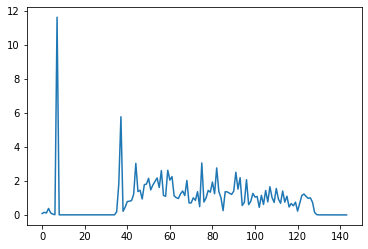

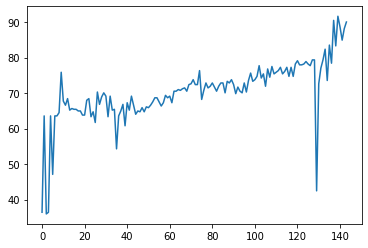



Test set: Average loss: 0.0035, Accuracy: 380/431 (88%)



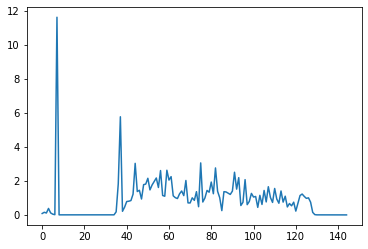

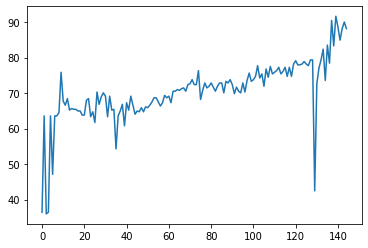



Test set: Average loss: 0.0053, Accuracy: 351/431 (81%)



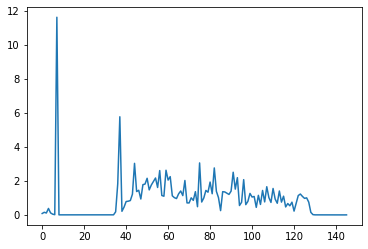

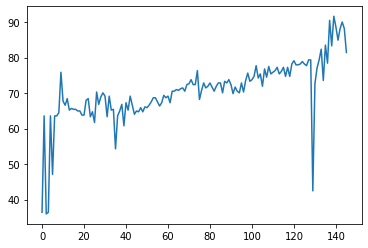



Test set: Average loss: 0.0043, Accuracy: 362/431 (84%)



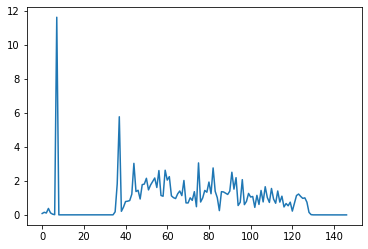

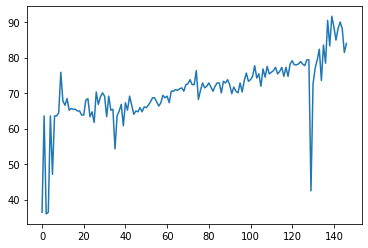



Test set: Average loss: 0.0034, Accuracy: 382/431 (89%)



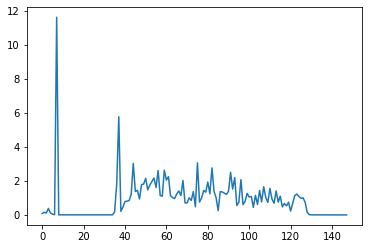

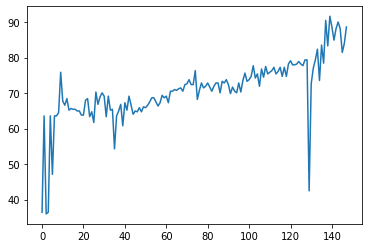



Test set: Average loss: 0.0039, Accuracy: 379/431 (88%)



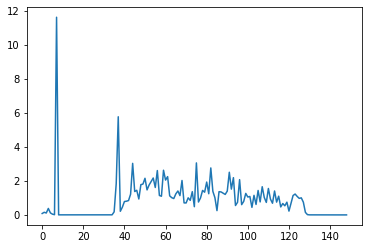

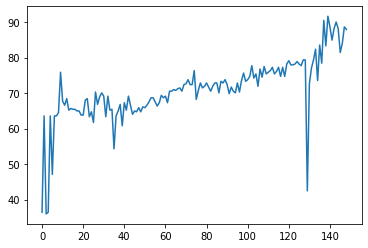



Test set: Average loss: 0.0035, Accuracy: 379/431 (88%)



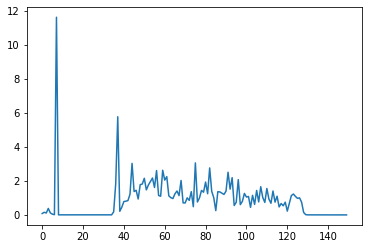

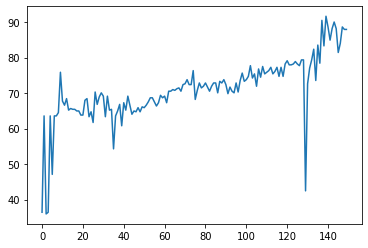



Test set: Average loss: 0.0044, Accuracy: 370/431 (86%)



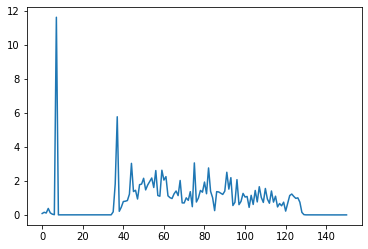

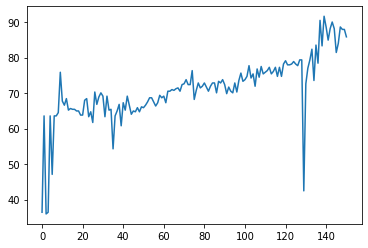



Test set: Average loss: 0.0037, Accuracy: 385/431 (89%)



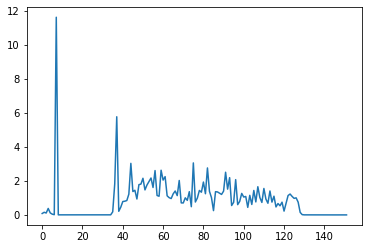

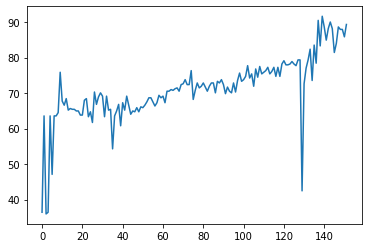



Test set: Average loss: 0.0124, Accuracy: 325/431 (75%)



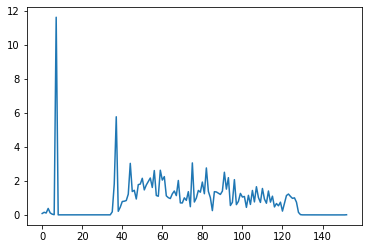

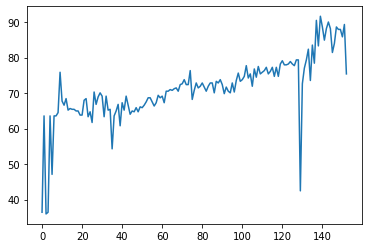



Test set: Average loss: 0.0073, Accuracy: 350/431 (81%)



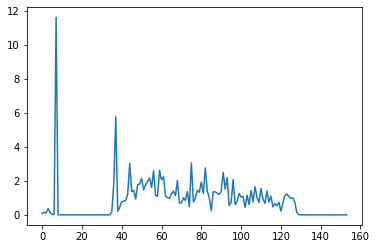

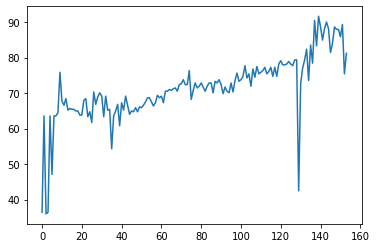



Test set: Average loss: 0.0068, Accuracy: 324/431 (75%)



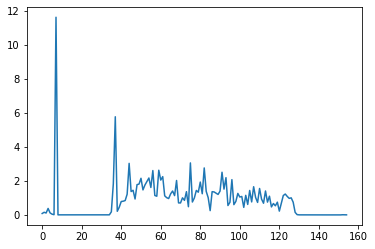

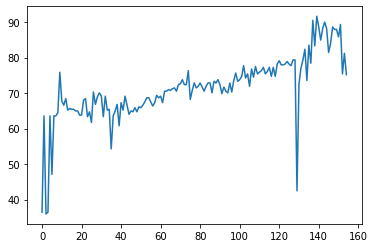



Test set: Average loss: 0.0096, Accuracy: 333/431 (77%)



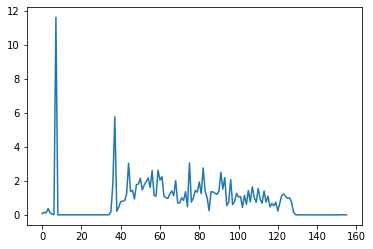

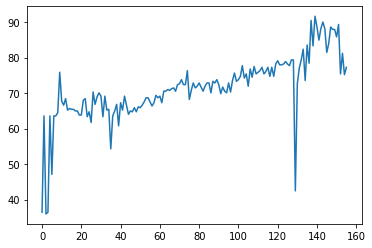



Test set: Average loss: 0.0043, Accuracy: 372/431 (86%)



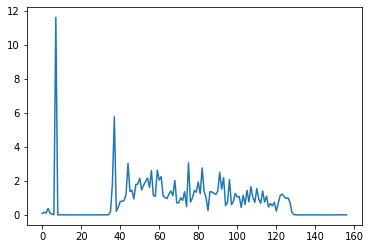

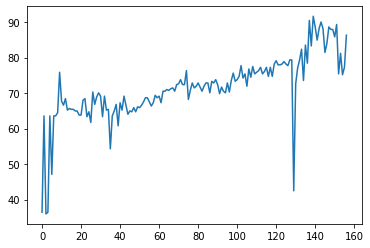



Test set: Average loss: 0.0034, Accuracy: 382/431 (89%)



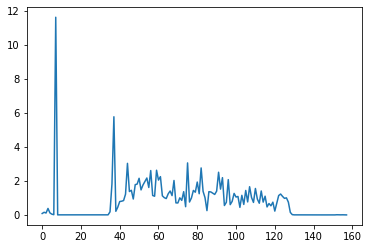

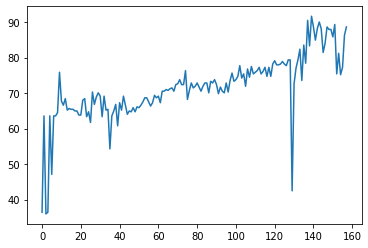



Test set: Average loss: 0.0042, Accuracy: 373/431 (87%)



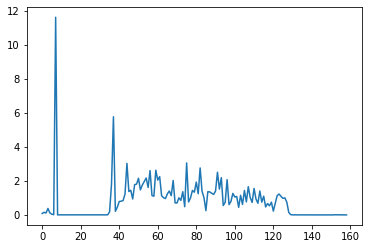

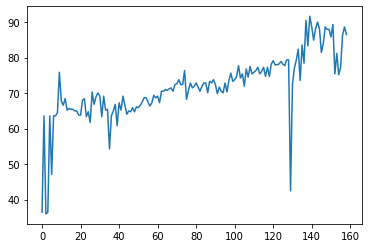



Test set: Average loss: 0.0043, Accuracy: 378/431 (88%)



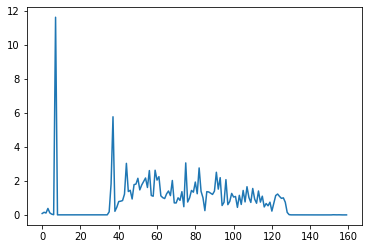

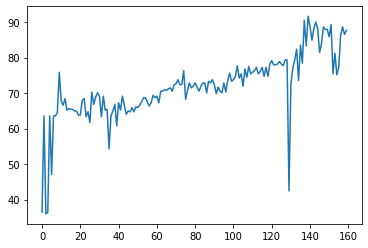



Test set: Average loss: 0.0052, Accuracy: 372/431 (86%)



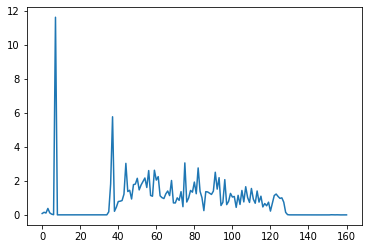

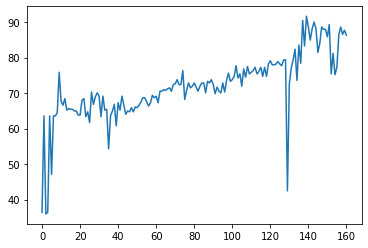



Test set: Average loss: 0.0060, Accuracy: 365/431 (85%)



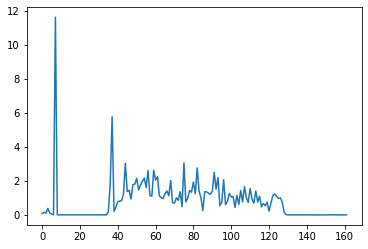

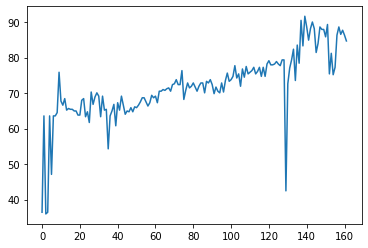



Test set: Average loss: 0.0062, Accuracy: 351/431 (81%)



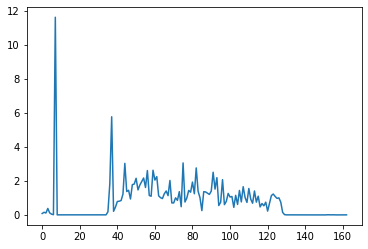

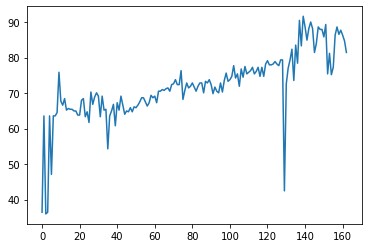



Test set: Average loss: 0.0102, Accuracy: 342/431 (79%)



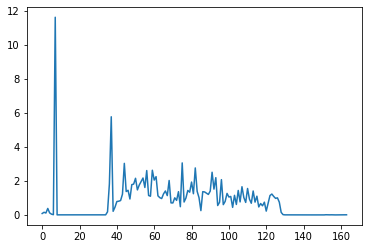

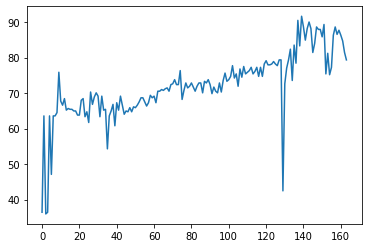



Test set: Average loss: 0.0187, Accuracy: 341/431 (79%)



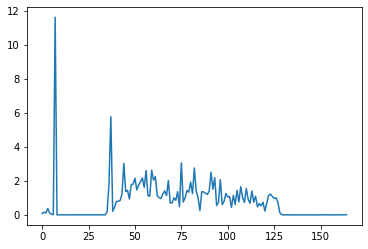

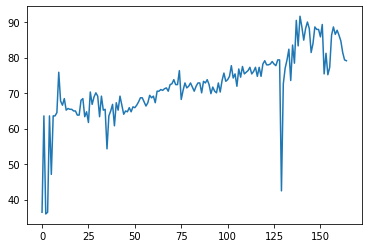



Test set: Average loss: 0.0047, Accuracy: 374/431 (87%)



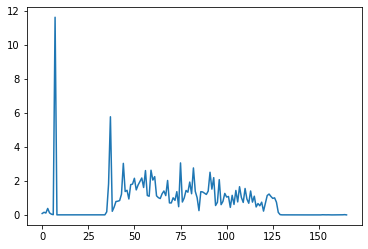

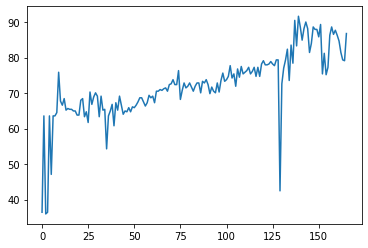



Test set: Average loss: 0.0067, Accuracy: 360/431 (84%)



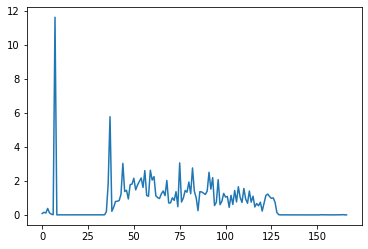

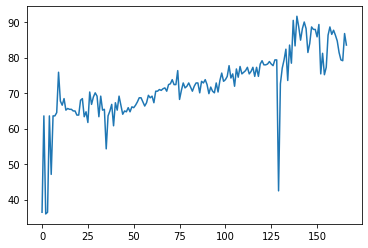



Test set: Average loss: 0.0058, Accuracy: 371/431 (86%)



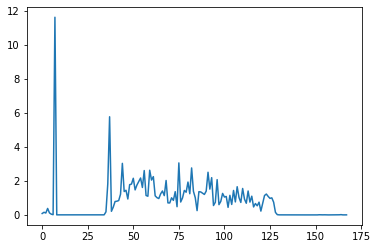

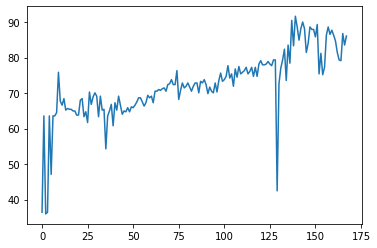



Test set: Average loss: 0.0078, Accuracy: 351/431 (81%)



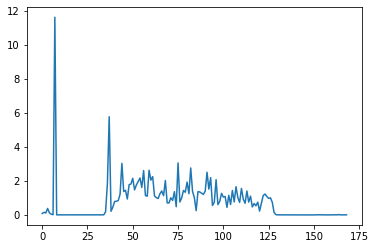

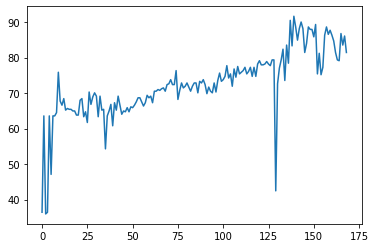



Test set: Average loss: 0.0031, Accuracy: 392/431 (91%)



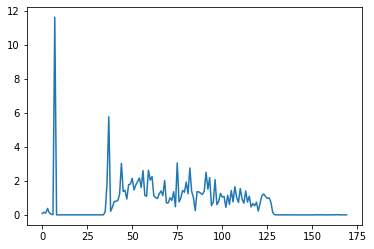

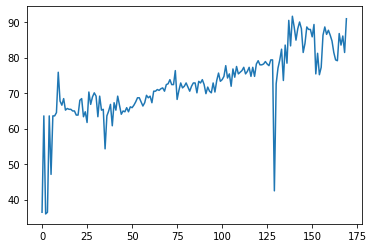



Test set: Average loss: 0.0024, Accuracy: 389/431 (90%)



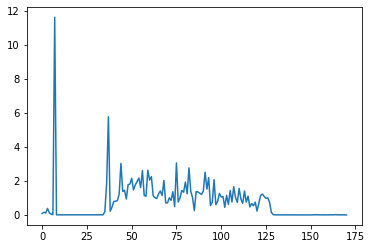

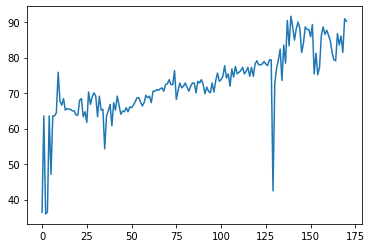



Test set: Average loss: 0.0032, Accuracy: 388/431 (90%)



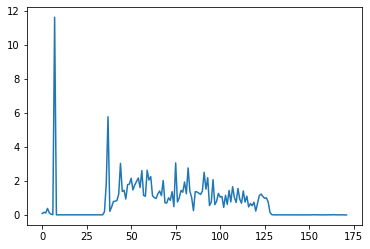

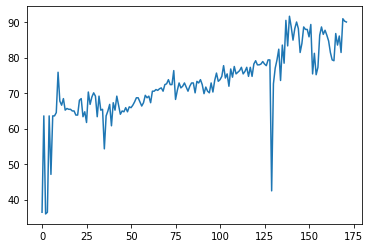



Test set: Average loss: 0.0036, Accuracy: 381/431 (88%)



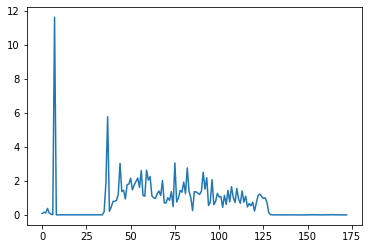

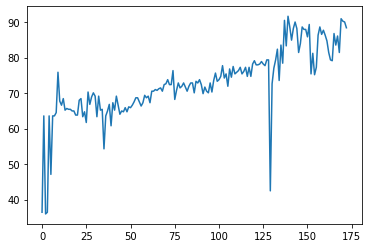



Test set: Average loss: 0.0043, Accuracy: 378/431 (88%)



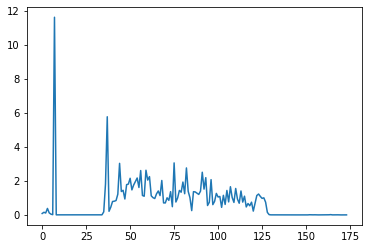

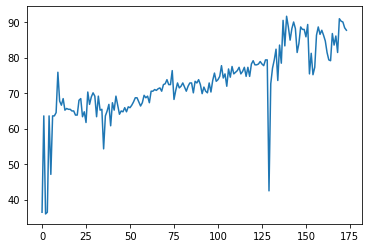



Test set: Average loss: 0.0069, Accuracy: 361/431 (84%)



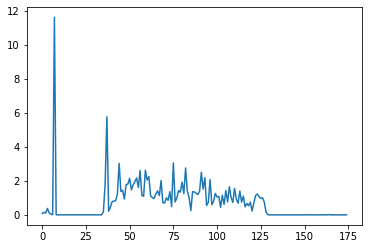

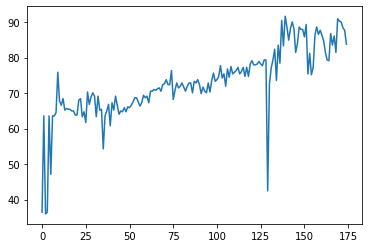



Test set: Average loss: 0.0065, Accuracy: 363/431 (84%)



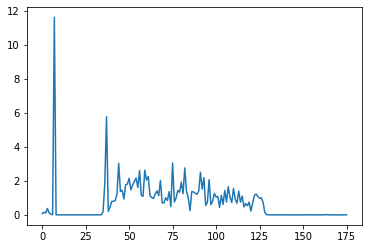

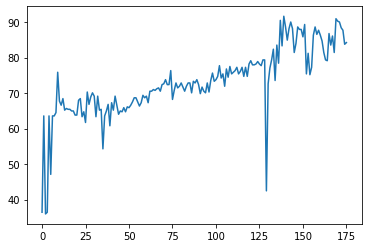



Test set: Average loss: 0.0069, Accuracy: 361/431 (84%)



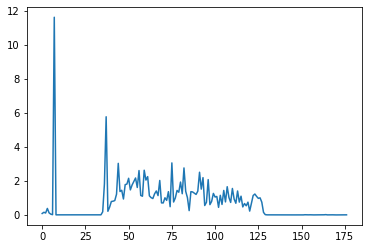

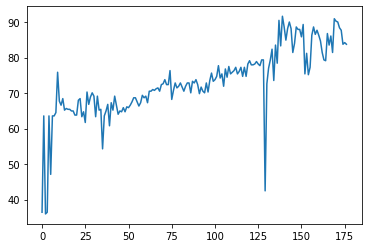



Test set: Average loss: 0.0075, Accuracy: 358/431 (83%)



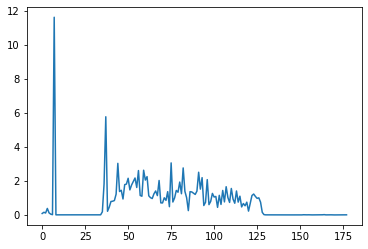

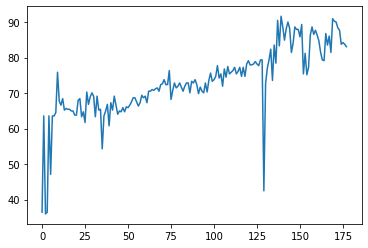



Test set: Average loss: 0.0086, Accuracy: 355/431 (82%)



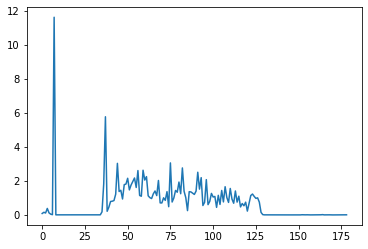

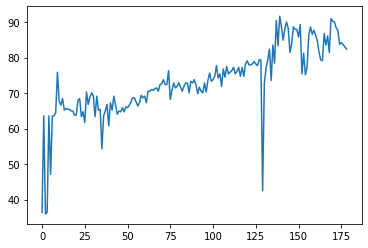



Test set: Average loss: 0.0072, Accuracy: 362/431 (84%)



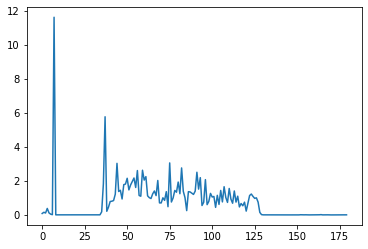

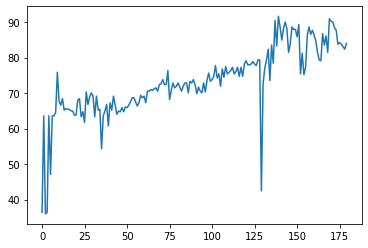



Test set: Average loss: 0.0067, Accuracy: 364/431 (84%)



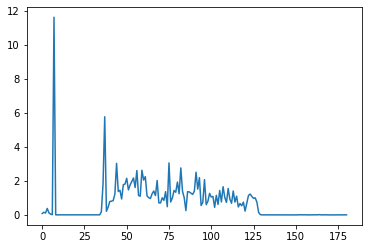

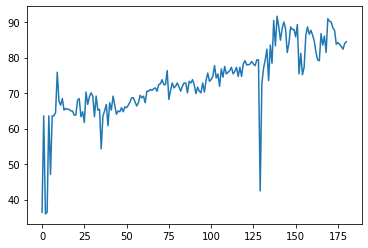



Test set: Average loss: 0.0080, Accuracy: 363/431 (84%)



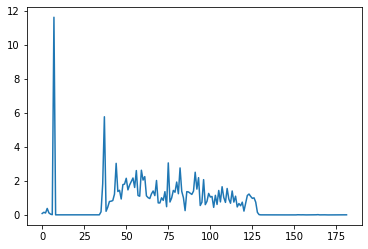

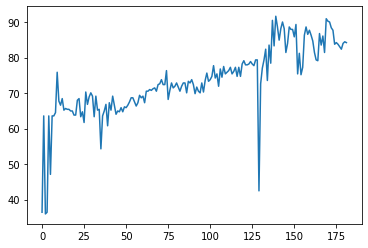



Test set: Average loss: 0.0103, Accuracy: 350/431 (81%)



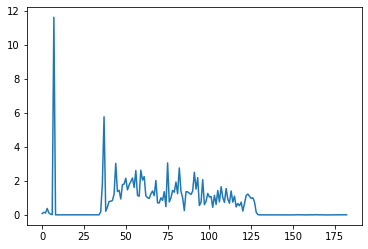

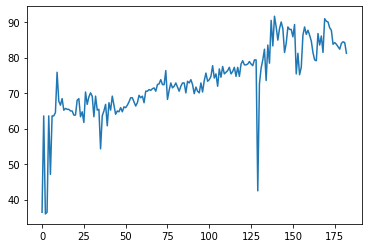



Test set: Average loss: 0.0085, Accuracy: 359/431 (83%)



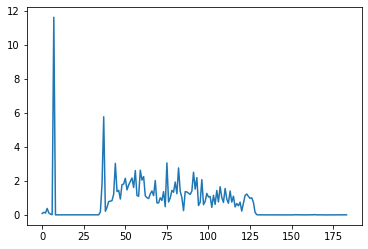

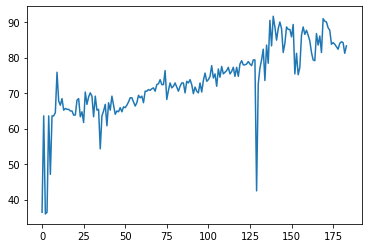



Test set: Average loss: 0.0078, Accuracy: 357/431 (83%)



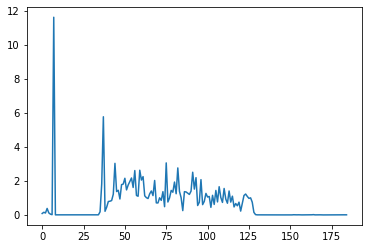

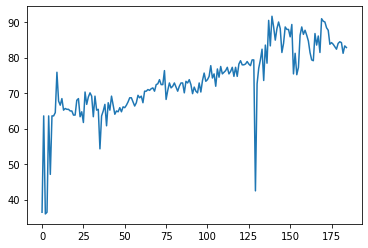



Test set: Average loss: 0.0098, Accuracy: 354/431 (82%)



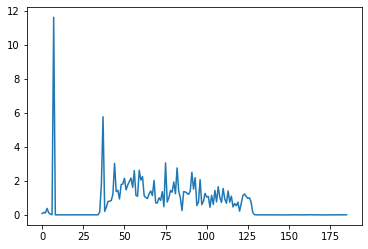

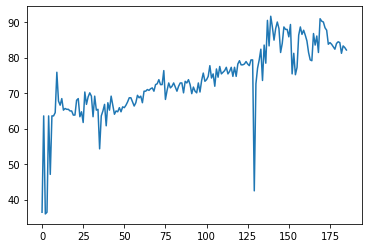



Test set: Average loss: 0.0117, Accuracy: 344/431 (80%)



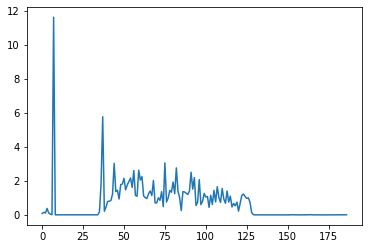

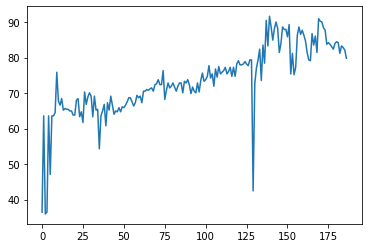



Test set: Average loss: 0.0328, Accuracy: 326/431 (76%)



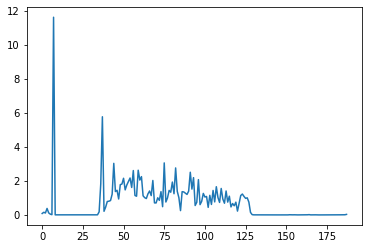

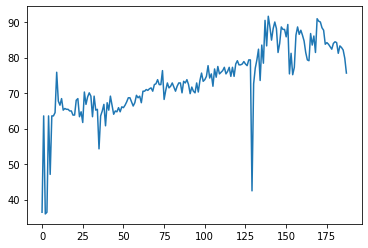



Test set: Average loss: 0.0545, Accuracy: 327/431 (76%)



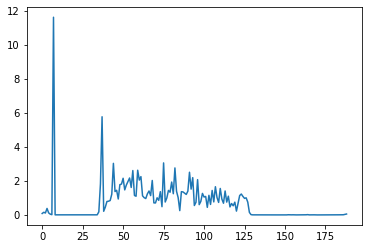

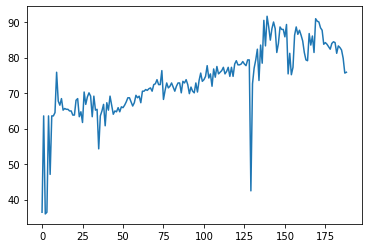



Test set: Average loss: 0.0751, Accuracy: 320/431 (74%)



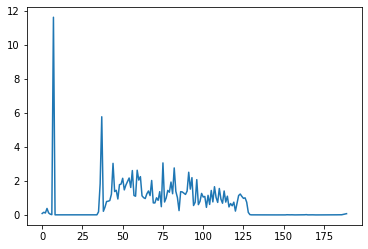

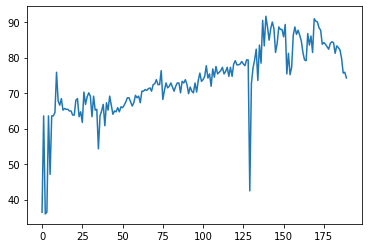



Test set: Average loss: 0.0474, Accuracy: 326/431 (76%)



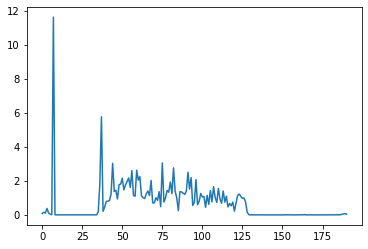

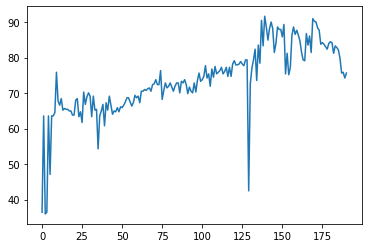



Test set: Average loss: 0.0608, Accuracy: 325/431 (75%)



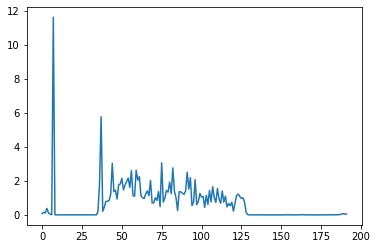

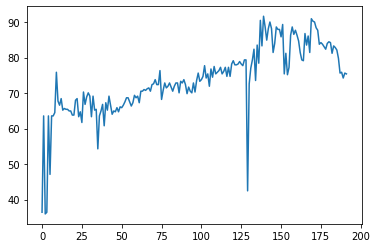



Test set: Average loss: 0.0507, Accuracy: 322/431 (75%)



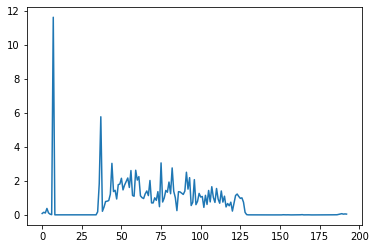

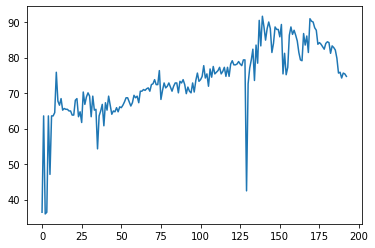



Test set: Average loss: 0.0386, Accuracy: 324/431 (75%)



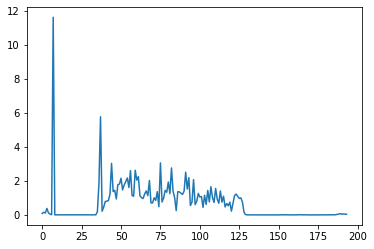

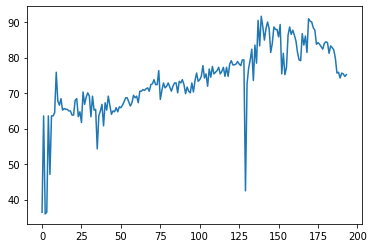



Test set: Average loss: 0.0708, Accuracy: 322/431 (75%)



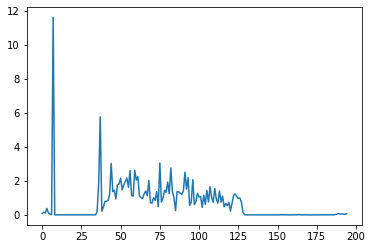

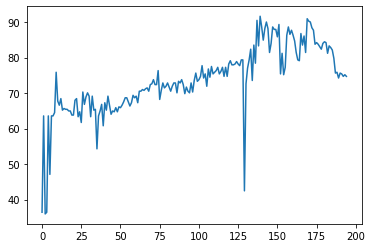



Test set: Average loss: 0.0409, Accuracy: 329/431 (76%)



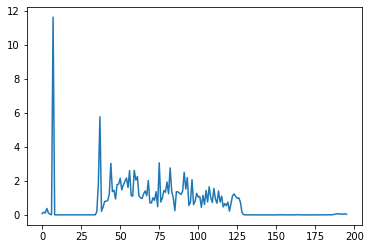

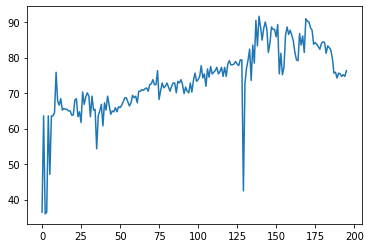



Test set: Average loss: 0.0623, Accuracy: 326/431 (76%)



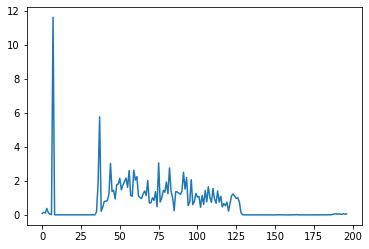

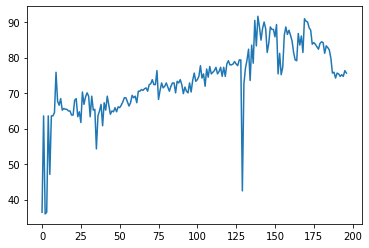



Test set: Average loss: 0.0353, Accuracy: 332/431 (77%)



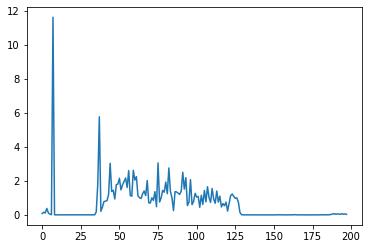

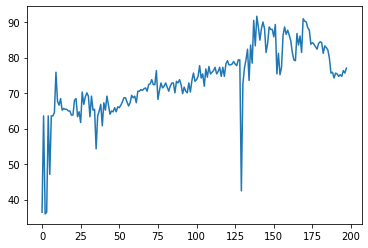



Test set: Average loss: 0.1157, Accuracy: 325/431 (75%)



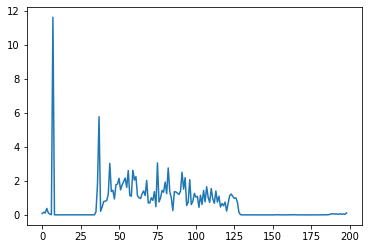

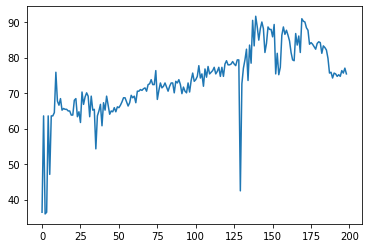



Test set: Average loss: 0.0839, Accuracy: 320/431 (74%)



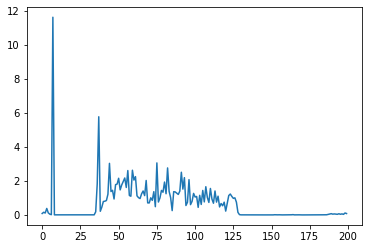

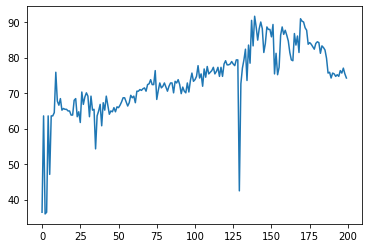


Best VAL test accuracy:  91.64733178654292 % after  139  training epochs

Best model on the test set: 

Test set: Average loss: 0.0051, Accuracy: 192/215 (89%)



(0.005131304402684057, 89.30232558139535)

In [ ]:
epochs = 100
for epoch in tqdm(range(1, epochs + 1), desc = "Total Training Progress"):

    for unsup_data, _ in tqdm(unsup_loader, desc="Epoch %d: Training on Unlabeled Data" % epoch):
        
        # TRAIN THE DISCRIMINATOR (THE CLASSIFIER)
        classifier.train()
        optimizerC.zero_grad()
        
        # 1. on Unlabelled data
        unsup_data = unsup_data.to(device)        
        outputs = classifier(unsup_data)    
        logz_unlabel = log_sum_exp(outputs)
        lossUL = 0.5 * (-torch.mean(logz_unlabel) + torch.mean(F.softplus(logz_unlabel)))
        lossUL.backward()  
        
        # 2. on the generated data

        noise = torch.randn(batch_size, 100, 1, 1, device=device)
        generated = (netG(noise)+1.0)/2.0
        outputs = classifier(generated.detach()) # detach() because we are not training G here
        logz_fake = log_sum_exp(outputs)
        lossD = 0.5*torch.mean(F.softplus(logz_fake))
        lossD.backward()

        optimizerC.step()
        
        # TRAIN THE GENERATOR
        netG.train()
        optimizerG.zero_grad()
        
        outputs = classifier(generated)
        logz_unlabel = log_sum_exp(outputs)
        lossG = 0.5 * (-torch.mean(logz_unlabel) + torch.mean(F.softplus(logz_unlabel)))
        lossG.backward()
        optimizerG.step()

    for labeled_data, labels in tqdm(train_loader, desc="Epoch %d: Training on Labeled Data" % epoch):
        # 3. on labeled data
        labeled_data, labels = labeled_data.to(device), labels.to(device)
        output = classifier(labeled_data)
        logz_label = log_sum_exp(output)
        prob_label = torch.gather(output, 1, labels.unsqueeze(1))
        labeled_loss = -torch.mean(prob_label) + torch.mean(logz_label)
        labeled_loss.backward()    

        optimizerC.step()
        

            
    
    generated = (netG(fixed_noise)+1.0)/2.0
    vutils.save_image(generated.cpu().detach(), 
                      ('/content/gdrive/MyDrive/MBSUS/Training+Testing/Generated Images/generated_28x28_%d.jpg' % epoch), normalize=True)
    
    val_loss, val_accuracy = test(classifier, device, val_loader, len_val, True)
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)
        
    if val_accuracy > best_acc:
        best_acc = val_accuracy
        best_classifier_wts = copy.deepcopy(classifier.state_dict())

    plt.plot(range(len(val_losses)), np.array(val_losses), label = "Val Loss")
    plt.show()
    plt.plot(range(len(val_accuracies)), np.array(val_accuracies), label = "Val Accuracies")
    plt.show()

print('Best VAL test accuracy: ', np.max(np.array(val_accuracies)),
      '% after ', np.argmax(np.array(val_accuracies)), ' training epochs')

# load best model weights
classifier.load_state_dict(best_classifier_wts)

print("\nBest model on the test set: ")
test(classifier, device, test_loader, len_test, True)   

In [ ]:
print('Best VAL test accuracy: ', np.max(np.array(val_accuracies)),
      '% after ', np.argmax(np.array(val_accuracies)), ' training epochs')

# load best model weights
classifier.load_state_dict(best_classifier_wts)

print("\nBest model on the test set: ")
test(classifier, device, test_loader, len_test, True) 

Best VAL test accuracy:  89.55916473317865 % after  150  training epochs

Best model on the test set: 

Test set: Average loss: 0.0044, Accuracy: 191/215 (89%)



(0.004366870285120121, 88.83720930232558)

In [ ]:
%cd /content/gdrive/My Drive/MBSUS/

#GEN_PATH = "Pneumonia_Cond_Generator_v2.pt"
CRIT_PATH = "SSGAN-89p.pt"

#torch.save(gen, GEN_PATH)
torch.save(classifier, CRIT_PATH)

/content/gdrive/My Drive/MBSUS


#Test on real video Data

In [ ]:
batch_size = 20
out_dir = '/content/gdrive/MyDrive/MBSUS/Training+Testing/Training'
dataset = datasets.ImageFolder(out_dir, transform=transform)


data_loader = DataLoader(
    dataset,
    batch_size = batch_size,
    shuffle = True
)
dataset.class_to_idx
results = test(classifier, device, data_loader, len(dataset), display = True)


Test set: Average loss: 0.0199, Accuracy: 1903/2154 (88%)



In [ ]:
resize = 28
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,)),
                                transforms.Resize((resize,resize),interpolation=Image.NEAREST),
                                transforms.Grayscale(num_output_channels=1)
])

In [ ]:
out_dir = '/content/gdrive/MyDrive/MBSUS/Frames To Be Analyzed/Frames To Be Analyzed/Healthy'
from PIL import Image


for image in tqdm(os.listdir(out_dir)):
  img = Image.open(out_dir + "/" + image)
  img = transform(img)
  img = img.to(device)

  prediction = classifier(img[None, ...])
  prediction = prediction.argmax(dim=1, keepdim=True)
  print(image + ": %d" %prediction.item())
  # print(prediction)


Copy of 012-0-LPT_frame_0ms.jpg: 1
Copy of 012-0-LPT_frame_2ms.jpg: 1
Copy of 012-0-LPT_frame_85ms.jpg: 1
Copy of 012-0-LPT_frame_148ms.jpg: 1
Copy of 012-0-LPT_frame_208ms.jpg: 1
Copy of 012-0-LPT_frame_275ms.jpg: 0
Copy of 012-0-LPT_frame_332ms.jpg: 0
Copy of 012-0-LPT_frame_382ms.jpg: 1
Copy of 012-0-LPT_frame_448ms.jpg: 1
Copy of 012-0-LPT_frame_493ms.jpg: 1
Copy of 012-0-LPT_frame_550ms.jpg: 1
Copy of 012-0-LPT_frame_603ms.jpg: 0
Copy of 012-0-LPT_frame_657ms.jpg: 0
Copy of 012-0-LPT_frame_715ms.jpg: 0
Copy of 012-0-LPT_frame_757ms.jpg: 0
Copy of 012-0-LPT_frame_813ms.jpg: 0
Copy of 012-0-LPT_frame_2588ms.jpg: 0
Copy of 012-0-LPT_frame_2645ms.jpg: 0
Copy of 012-0-LPT_frame_2697ms.jpg: 0
Copy of 012-0-LPT_frame_2753ms.jpg: 0
Copy of 012-0-LPT_frame_2805ms.jpg: 0
Copy of 012-0-LPT_frame_2858ms.jpg: 0
Copy of 012-0-LPT_frame_2913ms.jpg: 0
Copy of 012-0-LPT_frame_2967ms.jpg: 0
Copy of 012-0-LPT_frame_3022ms.jpg: 0
Copy of 012-0-LPT_frame_3070ms.jpg: 0
Copy of 012-0-LPT_frame_3128ms.jp

In [ ]:
batch_size = 20
out_dir = '/content/gdrive/MyDrive/MBSUS/Frames To Be Analyzed/Frames To Be Analyzed/Healthy'
dataset = datasets.ImageFolder(out_dir, transform=transform)


data_loader = DataLoader(
    dataset,
    batch_size = batch_size,
    shuffle = True
)
dataset.class_to_idx
results = test(classifier, device, data_loader, len(dataset), display = True)

{'Healthy': 0, 'Pneumonia': 1}


Test set: Average loss: 0.2645, Accuracy: 32/170 (19%)



Resources:

https://blog.scaleway.com/semi-supervised/

https://arxiv.org/pdf/1606.03498.pdf

https://github.com/samet-akcay/ganomaly

https://github.com/Sleepychord/ImprovedGAN-pytorch

https://github.com/xinario/awesome-gan-for-medical-imaging

https://arxiv.org/abs/1804.03700

https://arxiv.org/pdf/1804.03700.pdf

https://ieeexplore-ieee-org.libproxy.umassd.edu/document/8363749

https://arxiv.org/pdf/1805.06725.pdf

